<a href="https://colab.research.google.com/github/rjmendezm/CV/blob/main/rjmendezm_pec1_recuperacion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.875 · Deep Learning · PEC1</p>
<p style="margin: 0; text-align:right;">2024-2 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


# PEC 1: Redes neuronales artificiales y convolucionales con Keras - Clasificación de imágenes y Superresolución

A lo largo de esta práctica implementaremos varios modelos de redes neuronales, empleando Keras sobre la base de datos Imagenette (versión 320px)​. En concreto, abordaremos las siguientes tareas:
1. Descarga, análisis y pre-procesado de los datos (1.5 pts)
2. Red Neuronal Artificial (ANN) completamente conectada (1.5 pts)
3. Pequeña Red Neuronal Convolucional (CNN) (2 pts)
4. Aumentación de datos (1 pt)
5. Superresolución de imágenes con CNNs (1.5 pts)
6. Inferencia, métricas y visualización de resultados (1 pt)
7. Modelo pre-entrenado en superresolución (1 pt)
8. Comparativa y conclusiones (0.5 pts)

<u>Consideraciones generales</u>:

- La solución planteada no puede utilizar métodos, funciones o parámetros declarados **_deprecated_** en futuras versiones.
- Esta PEC debe realizarse de forma **estrictamente individual**. Cualquier indicio de copia será penalizado con un suspenso (D) para todas las partes implicadas y la posible evaluación negativa de la asignatura de forma íntegra.
- Es necesario que el estudiante indique **todas las fuentes** que ha utilizado para la realización de la PEC. De no ser así, se considerará que el estudiante ha cometido plagio, siendo penalizado con un suspenso (D) y la posible evaluación negativa de la asignatura de forma íntegra.
- Si se hace uso de cualquier **IA generativa** en la resolución de la PEC esta **debe referenciarse** en aquellos apartados donde se haya utilizado, como cualquier otra fuente.

<u>Formato de la entrega</u>:

- Algunos ejercicios pueden suponer varios minutos de ejecución, por lo que la entrega debe hacerse en **formato notebook** y en **formato html**, donde se vea el código, los resultados y comentarios de cada ejercicio. Se puede exportar el notebook a HTML en Jupyter Notebook desde el menú File $\to$ Download as $\to$ HTML.
- Existe un tipo de celda especial para albergar texto. Este tipo de celda os será muy útil para responder a las diferentes preguntas teóricas planteadas a lo largo de la actividad. Para cambiar el tipo de celda a este tipo, en el menú: Cell $\to$ Cell Type $\to$ Markdown.

## 0. Contexto y carga de librerías
A lo largo de esta práctica vamos a implementar varios modelos de redes neuronales para clasificar las imágenes de la base de datos [Imagenette](https://github.com/fastai/imagenette).

La base de datos Imagenette es un subconjunto de 10 clases fácilmente clasificables de [Imagenet](https://www.image-net.org/), un proyecto que ha sido fundamental para avanzar en la investigación sobre visión artificial y aprendizaje profundo. Imagenette contiene alrededor de 13.000 imágenes de diferentes tamaños pertenecientes a 10 categorías (tench, English springer, cassette player, chain saw, church, French horn, garbage truck, gas pump, golf ball, parachute), cada una en una carpeta distinta.

Concretamente en esta PEC utilizaremos una versión (Imagenette2-320) que ha sido reescalada pero manteniendo el aspect ratio de cada imagen (se han ajustado de forma que la dimensión menor de cada imagen es 320 píxeles). Esto atenuará la carga computacional de los algoritmos al usar bases de datos de imágenes pero manteniendo la suficiente calidad necesaria para nuestros experimentos. Los datos vienen separados en 2 conjuntos, entrenamiento y validación.

**Nota: Debido al uso de imágenes como datos en esta práctica, los entrenamientos de cada ejercicio se pueden demorar desde unos minutos a más de media hora utilizando GPU (los tiempos con CPU son sensiblemente más largos). Se recomienda realizar la práctica en el entorno que ofrece la plataforma Kaggle, ya que ofrece un entorno gratuito con 30 horas semanales de uso de GPU.**

A lo largo de toda la práctica, para la creación de las distintas redes, iremos alternando el uso del modelo [Sequential](https://keras.io/guides/sequential_model/) y el modelo [Functional](https://keras.io/guides/functional_api/) de Keras a través de las clases [Sequential](https://keras.io/api/models/sequential/) y [Model](https://keras.io/api/models/model/) respectivamente.

Se aconseja la lectura detallada de la documentación de ambos modelos para llevar a cabo la realización de la práctica.

Empezamos instalando y cargando las librerías más relevantes:

# Extra: Las 10 categorías del problema de clasificación (Inglés/Español)
\begin{array}{|l|l|} \hline
\textbf{Inglés} & \textbf{Español} \\ \hline
\text{Tench} & \text{Tinca} \\ \hline
\text{English springer} & \text{Raza de perro} \\ \hline
\text{Cassette player} & \text{Reproductor de casetes} \\ \hline
\text{Chain saw} & \text{Motosierra} \\ \hline
\text{Church} & \text{Iglesia} \\ \hline
\text{French horn} & \text{Trompa} \\ \hline
\text{Garbage truck} & \text{Camión de basura} \\ \hline
\text{Gas pump} & \text{Surtidor de gasolina} \\ \hline
\text{Golf ball} & \text{Pelota de golf} \\ \hline
\text{Parachute} & \text{Paracaídas} \\ \hline
\end{array}

In [ ]:
# Instalamos la última versión de Tensorflow (con CUDA)
#!pip install tensorflow[and-cuda]

In [ ]:
# Importamos Tensorflow
import tensorflow as tf
print("TensorFlow version   : ", tf.__version__)

# Necesitaremos GPU
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

# Keras version is 3.5.0
from tensorflow import keras
print("Keras version   : ", keras.__version__)

TensorFlow version   :  2.17.1
GPU is available
Keras version   :  3.5.0


In [ ]:
# Importamos los elementos de Keras que utilizaremos con mayor frecuencia
from keras.utils import image_dataset_from_directory
from keras.layers import (Input, Dense, Dropout, Flatten, Conv2D, Conv2DTranspose,
                          MaxPooling2D, UpSampling2D, Rescaling, Resizing,
                          RandomFlip, RandomRotation)
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.optimizers import Adam

In [ ]:
# Importamos algunas librerías que necesitaremos para la PEC
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime


In [ ]:
# Reuno acá otras librerías utilizadas puntualmente a lo largo de la PEC

#* Para leer directories y definir rutas como objetos
import os
from pathlib import Path


#* Forma alternativa de definir capa de entrada a la red
from keras.layers import InputLayer

#* Para descargar model pre-entrenado
import tensorflow_hub as hub

#* Para es coger muestras de imágenes a azar
import random

#* Para calcular logaritmo al calcular el PSNR en superresolución
import math

#* Para medir e imprimir el tiempo de entrenamiento y evitar que se interrumpi la sesión (time.sleep())
import time
from datetime import timedelta

## 1. Descarga, análisis y pre-procesado de los datos (1,5 puntos)

En este apartado exploraremos la base de datos y prepararemos la carga de las imágenes para los modelos de los siguientes apartados.

Para crear nuestra base de datos tenemos que descargar el archivo de imágenes desde el siguiente [enlace](https://drive.google.com/file/d/16kqYxjXK0xDDYQ4xF3PBgsa0NG3gwT4L/view?usp=sharing) (es un archivo .zip que ocupa aproximadamente 340 MB).

**NOTA: para poder descargar el archivo de imágenes tenéis que iniciar sesión con el usuario y contraseña de la UOC.**

A partir de aquí:

- Si trabajamos en local simplemente tenemos que descomprimir el archivo descargado.

- Si trabajamos desde Kaggle debemos subir el notebook del enunciado a la plataforma (para ello podéis seguir los 6 primeros pasos del siguiente [artículo](https://rajputankit22.medium.com/how-to-upload-my-own-notebook-to-kaggle-2b0dedbb5a6b)) y después, una vez subido el notebook, expandir la barra lateral desplegable de la derecha y en el menú 'Input'  clickar el botón 'Upload' y subir el archivo descargado previamente. Después hay que darle un nombre a la base de datos y cuando se cargue el fichero ya tendréis accesible la base de datos en la ruta <code>../input/</code>.

Una vez tenemos la base de datos accesible vamos a inspeccionarla.

En la carpeta <code>/images</code> (si trabajamos en local) o <code>/kaggle/input/nombre-base-de-datos/images</code> (si trabajamos desde Kaggle) encontramos 2 carpetas:
- En la carpeta <code>/train/</code> se encuentra el total de las imágenes de entrenamiento separadas por clases (cada clase en una carpeta distinta).
- En la carpeta <code>/val/</code> se encuentra el total de las imágenes de validación separadas por clases (cada clase en una carpeta distinta).

Como podemos observar, tenemos imágenes para realizar el entrenamiento y la validación de los modelos pero no tenemos un conjunto de prueba, lo crearemos durante en este primer apartado.

Comencemos obteniendo los datos y analizando su estructura y características.
### 1.1. Análisis de los archivos de imágenes

En primer lugar, inspeccionaremos la organización de los datos.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 1.1 [0.5 pts]:</strong> A partir de la estructura de carpetas indicada, y para cada conjunto de datos (<code>train</code> y <code>val</code>):
    <ul>
        <li>Extrae los nombres de las 10 clases en cada conjunto y comprueba que son iguales.</li> <li>Calcula el número total de imágenes en cada conjunto.</li>
        <li>Obtén cuántas instancias hay en total para cada clase y representa la distribución en un diagrama de barras.</li>
        </ul>
Contesta además las siguientes preguntas:
    <ul>
        <li>¿Qué porcentaje del total de imágenes corresponde a cada conjunto (train/val)?</li>
        <li>Según los diagramas de barras, ¿podemos afirmar que la distribución por clases es similar en ambos conjuntos?</li>
        <li>En cuanto al número de imágenes por clase, ¿están las clases balanceadas o hay desequilibrios notables?</li>
    </ul>
<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>
</div>

In [ ]:
print(os.getcwd())
train_dir = '/kaggle/input/imagenes2/images/train'
val_dir = '/kaggle/input/imagenes2/images/val'

/kaggle/working


* Extrae los nombres de las 10 clases en cada conjunto

In [ ]:
# Listar clases en cada conjunto
class_names_train = sorted(os.listdir(train_dir))
class_names_val = sorted(os.listdir(val_dir))


#print("Clases en el conjunto de entrenamiento:", class_names_train)
#print("Clases en el conjunto de validación:", class_names_val)

print("Clases en el conjunto de entrenamiento:")
for clase in class_names_train:
    print(clase)

print("\n")
print("Clases en el conjunto de validación:")
for clase in class_names_val:
    print(clase)


Clases en el conjunto de entrenamiento:
English_springer
French_horn
cassette_player
chain_saw
church
garbage_truck
gas_pump
golf_ball
parachute
tench


Clases en el conjunto de validación:
English_springer
French_horn
cassette_player
chain_saw
church
garbage_truck
gas_pump
golf_ball
parachute
tench


* y comprueba que son iguales

In [ ]:
# Verificar que ambas listas de clases son iguales

if class_names_train == class_names_val:
  print("Las listas class_names_train y class_names_val son iguales.")
else:
  print("Las listas class_names_train y class_names_val son diferentes.")



Las listas class_names_train y class_names_val son iguales.


* Calcula el número total de imágenes en cada conjunto

In [ ]:
# Contar total de imágenes por conjunto y por clase

##>> Creo función para contar imágenes por conjunto y clase
def count_images_per_set_and_class(data_dir):
  """Counts the number of images in each class and set."""
  class_counts = {}
  for class_name in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
      num_images = len(os.listdir(class_path))
      class_counts[class_name] = num_images
  return class_counts

##>> Empleo la función para obtener los el conteo solicitado


# Imprimir número de imágenes por clase en train
train_class_counts = count_images_per_set_and_class(train_dir)
print("Número de imágenes por clase en el conjunto de entrenamiento:")
for class_name, count in train_class_counts.items():
  print(f"{class_name}: {count}")

# Imprimir número de imágenes por clase en val
val_class_counts = count_images_per_set_and_class(val_dir)
print("\nNúmero de imágenes por clase en el conjunto de validación:")
for class_name, count in val_class_counts.items():
  print(f"{class_name}: {count}")

Número de imágenes por clase en el conjunto de entrenamiento:
golf_ball: 951
church: 941
chain_saw: 858
cassette_player: 993
gas_pump: 931
French_horn: 956
English_springer: 955
parachute: 960
tench: 963
garbage_truck: 961

Número de imágenes por clase en el conjunto de validación:
golf_ball: 399
church: 409
chain_saw: 386
cassette_player: 357
gas_pump: 419
French_horn: 394
English_springer: 395
parachute: 390
tench: 387
garbage_truck: 389


* y representa la distribución en un diagrama de barras


Total Images Training: 9469


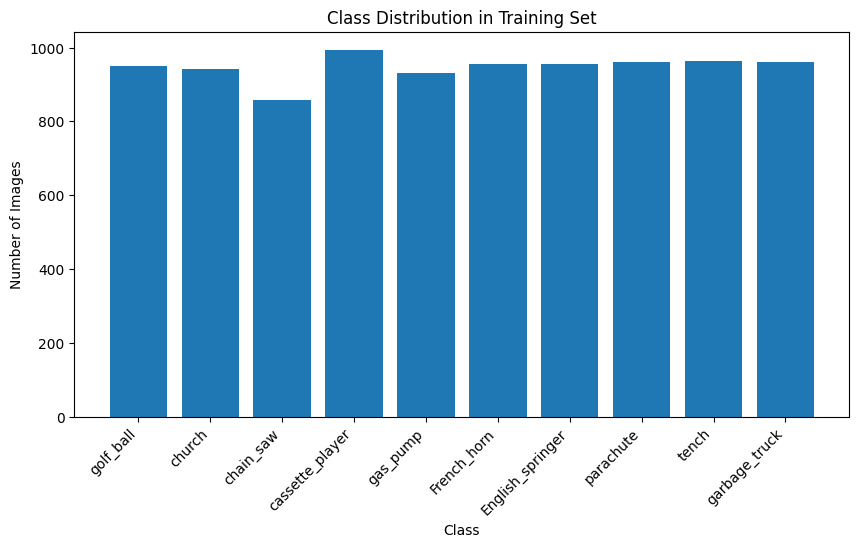


Total Images Validation: 3925


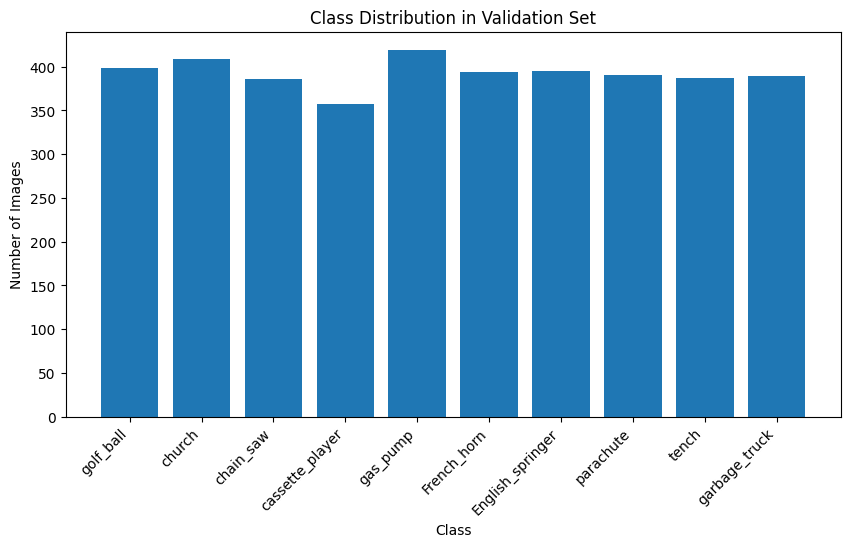

Total Images: 13394
Proportion Training   (%): 70.69583395550247
Proportion Validation (%): 29.304166044497535


In [ ]:
# Representación gráfica de la distribución de clases

##>> Gráfico de barra para conjunto de entrenamiento
class_counts = {}
total_images_train = 0
for class_name in os.listdir(train_dir):
  class_path = os.path.join(train_dir, class_name)
  if os.path.isdir(class_path):
    num_images = len(os.listdir(class_path))
    class_counts[class_name] = num_images
    total_images_train += num_images

print(f"\nTotal Images Training: {total_images_train}")
# Visualize class distribution with a bar chart
plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.title("Class Distribution in Training Set")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha="right")
plt.show()


##>> Gráfico de barra para conjunto de validación
class_counts = {}
total_images_val = 0
for class_name in os.listdir(val_dir):
  class_path = os.path.join(val_dir, class_name)
  if os.path.isdir(class_path):
    num_images = len(os.listdir(class_path))
    class_counts[class_name] = num_images
    total_images_val += num_images

print(f"\nTotal Images Validation: {total_images_val}")
# Visualize class distribution with a bar chart
plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.title("Class Distribution in Validation Set")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha="right")
plt.show()

print(f"Total Images: {total_images_val+total_images_train}")
print(f"Proportion Training   (%): {total_images_train*100/(total_images_val+total_images_train)}")
print(f"Proportion Validation (%): {total_images_val*100/(total_images_val+total_images_train)}")

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
        <ul>
        <li><strong>¿Qué porcentaje del total de imágenes corresponde a cada conjunto (train/val)?</strong></li>
        Training: 70.69%, Validación: 29.30%
        <li><strong>Según los diagramas de barras, ¿podemos afirmar que la distribución por clases es similar en ambos conjuntos?</strong></li>
        Sí, en ambos la distribución es similar, se aproxima a la uniforme em ambos casos.
        <li><strong>En cuanto al número de imágenes por clase, ¿están las clases balanceadas o hay desequilibrios notables?</strong></li>
        Sí, están bastante balanceadas. En el conjunto de validación el número de imágenes por categoría esta en el rango (350,450] y en el conjunto de entrenamiento en el rango (850,1000], de modo que en el conjunto agregado el número de imágenes por categoría está en el rango (1200,1450].
    </ul>     
<br><br>
</div>

### 1.2. Visualización de las imágenes.

Ahora examinaremos el formato de las imágenes para entender su tamaño y rango de valores. Visualizaremos algunas imágenes de ejemplo de cada clase.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 1.2 [0.5 pts]:</strong> Muestra a modo de ejemplo una imagen por cada categoría del conjunto de entrenamiento. Luego, responde:
    <ul>
        <li>¿Tienen todas las imágenes las mismas dimensiones (alto × ancho)?</li>
        <li>¿Cuál es el rango dinámico de pixel (valor mínimo y máximo) en las imágenes?</li>
        <li>¿Son adecuados estos valores para el entrenamiento de una red neuronal?</li>
        <li>¿Qué acciones de pre-procesado serían necesarias en relación a lo anterior?</li>
    </ul>
<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>
</div>

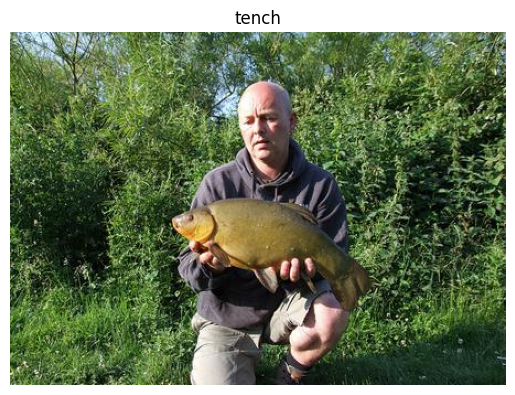

Dimensiones: 320x450
Rango dinámico de píxeles: Mínimo = 0, Máximo = 255


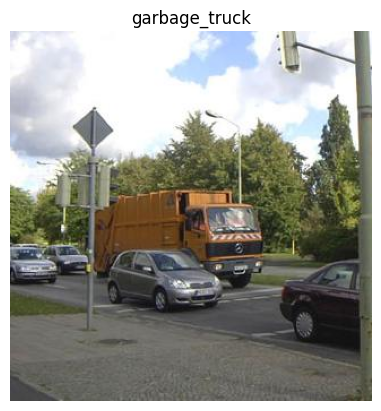

Dimensiones: 327x320
Rango dinámico de píxeles: Mínimo = 0, Máximo = 255


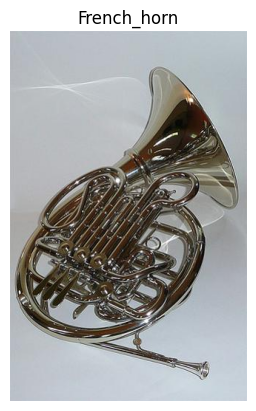

Dimensiones: 501x320
Rango dinámico de píxeles: Mínimo = 0, Máximo = 255


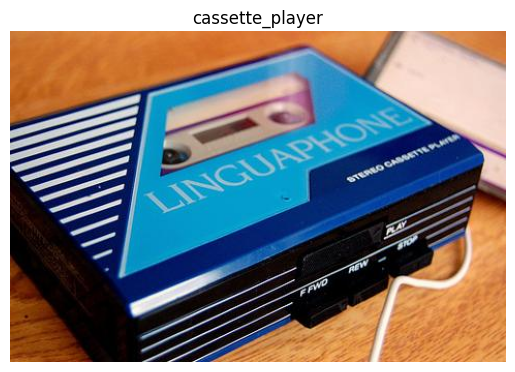

Dimensiones: 320x480
Rango dinámico de píxeles: Mínimo = 0, Máximo = 255


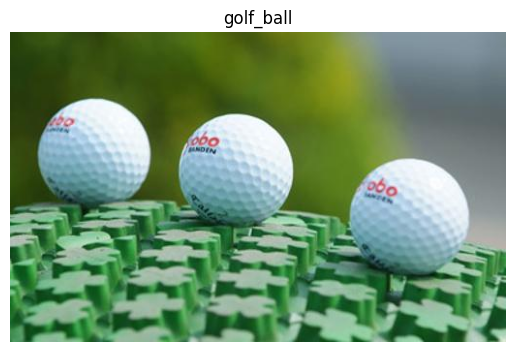

Dimensiones: 320x512
Rango dinámico de píxeles: Mínimo = 0, Máximo = 255


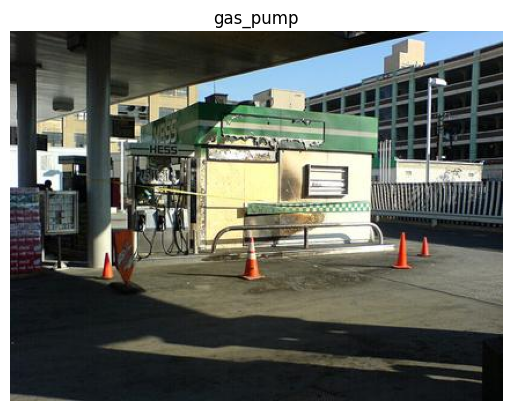

Dimensiones: 320x426
Rango dinámico de píxeles: Mínimo = 0, Máximo = 255


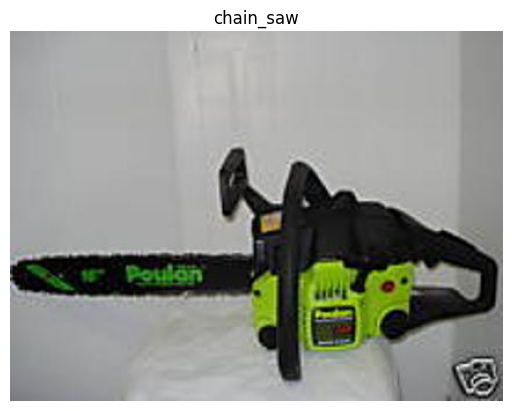

Dimensiones: 320x426
Rango dinámico de píxeles: Mínimo = 0, Máximo = 243


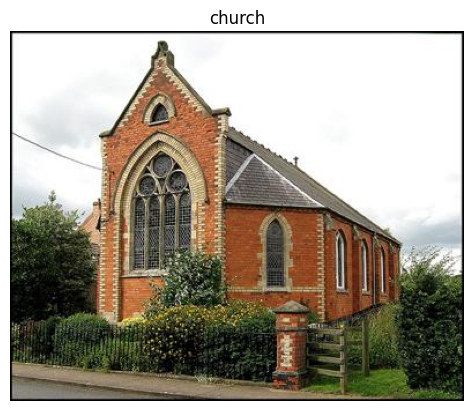

Dimensiones: 320x393
Rango dinámico de píxeles: Mínimo = 0, Máximo = 255


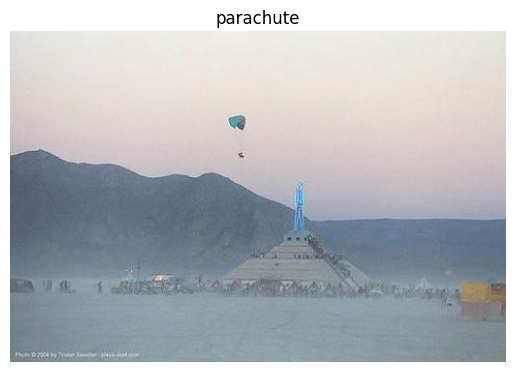

Dimensiones: 320x480
Rango dinámico de píxeles: Mínimo = 33, Máximo = 255


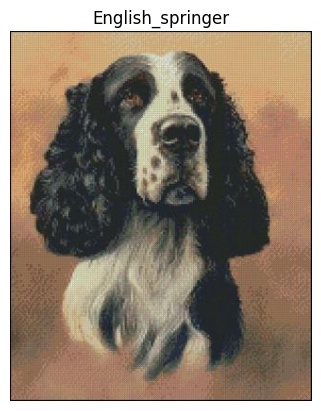

Dimensiones: 392x320
Rango dinámico de píxeles: Mínimo = 0, Máximo = 245


In [ ]:
import random
from PIL import Image

# Graficamos una imagen aleatoria por categoria del conjunto de entrenamiento,
# (mostrando debajo de cada imagen dimensiones y rango dinámico de píxeles)
for categoria in os.listdir(train_dir):
  ruta_categoria = os.path.join(train_dir, categoria)
  if os.path.isdir(ruta_categoria):
    lista_imagenes = os.listdir(ruta_categoria)
    if lista_imagenes:
      imagen_aleatoria = random.choice(lista_imagenes)
      ruta_imagen = os.path.join(ruta_categoria, imagen_aleatoria)

      try:
        imagen = Image.open(ruta_imagen)
        plt.figure()
        plt.imshow(imagen)
        plt.title(categoria)
        plt.axis('off')
        plt.show()

        # Obtener dimensiones y rango dinámico de píxeles
        ancho, alto = imagen.size
        imagen_np = np.array(imagen)
        min_pixel = imagen_np.min()
        max_pixel = imagen_np.max()

        # Imprimir información adicional
        print(f"Dimensiones: {alto}x{ancho}")
        print(f"Rango dinámico de píxeles: Mínimo = {min_pixel}, Máximo = {max_pixel}")

      except Exception as e:
       print(f"Error al abrir la imagen {ruta_imagen}: {e}")



<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
La dimensión y rango en píxeles se muestra debajo de cada imagen
<br><br>
        <ul>
        <li><strong>Tamaño</strong>:</li>
        No, no tienen la misma dimensión
        <li><strong>Rango dinámico</strong>:</li>
                Valor mínimo = 0, valor máximo = 255
        <li><strong>Adecuación para la red</strong>:</li>
        No, son adecuados: (1) Es necesario que las imagenes tengan la misma dimensión, (2) es recomendable que las imágenes sean normalizadas dentro de un rango [0,1] ó [-1,1]
        <li><strong>Acciones necesarias</strong>:</li>
        En el caso (1) el redimensionamiento (resizing) de las imagenes, en el caso (2) la normalización (reescaling) de las imagenes.
    </ul>
</div>

### 1.3. Creación de los conjuntos de datos en formato Keras/Tensorflow

A continuación, prepararemos los datos para el entrenamiento con Keras. Usaremos la función <code>**tf.keras.utils.image_dataset_from_directory()**</code> de TensorFlow/Keras, que permite crear lotes de datos etiquetados a partir de directorios de imágenes organizados por clase.

La documentación de esta función se encuentra tanto en la web de [Keras](https://keras.io/api/data_loading/image/) como en la de [Tensorflow](https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory).

Esta función nos facilitará generar conjuntos de entrenamiento, validación y prueba a partir de las carpetas analizadas. Las imágenes serán redimensionadas a un tamaño fijo y organizadas en lotes (batch).

**Especificaciones**: Vamos a convertir las imágenes a tamaño 160×160 píxeles y agruparlas en lotes de 64. Mantendremos el rango dinámico original en esta etapa, ya que más adelante aplicaremos una capa de reescalado para normalizarlas (al rango 0-1). También separaremos parte de los datos de test a partir de los de validación.


<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 1.3 [0.5 pts]:</strong> Utiliza la función <code>tf.keras.utils.image_dataset_from_directory()</code> para generar 3 conjuntos de datos a partir de las carpetas <code>/train</code> y <code>/val</code>:
    <ul>
        <li><strong>train_ds</strong>: Conjunto de entrenamiento a partir de <code>train/</code>. Redimensiona las imágenes a 160×160, con <code>batch_size=64</code> i <code>label_mode="categorical"</code> (10 categorías).</li>
        <li><strong>val_ds</strong>: Conjunto de validación a partir del directorio <code>val/</code>, con un <code>validation_split</code> de 0.5 usando <code>subset="validation"</code> en la función y fija un <code>seed</code> para reproducibilidad. De nuevo redimensiona las imágenes a 160×160, con <code>batch_size=64</code> y <code>label_mode="categorical"</code>.</li>
        <li><strong>test_ds</strong>: Conjunto de test a partir del mismo directorio <code>val/</code> usando <code>subset="training"</code> en la función (con el mismo <code>seed</code> para obtener la partición complementaria). Redimensiona también a 160×160 con <code>batch_size=64</code> y usa <code>label_mode="categorical"</code>.</li>
    </ul>
<strong>NOTA</strong>: la asignación de <code>subset="validation"</code> y <code>subset="training"</code> es completamente arbitraria y podría haberse realizado al revés. Lo importante es dividir los datos que se encuentran en la carpeta <code>/val</code> al 50% entre validación y test.
    <br><br>
Comprueba que la base de datos se ha creado correctamente imprimiendo por pantalla los nombres de las clases así como las dimensiones de cada conjunto de datos.

Responde a las siguientes preguntas:
    <ul>
        <li>¿Qué porcentaje aproximado de las imágenes se utiliza en cada uno de los 3 conjuntos?</li>
        <li>¿Qué otros porcentajes se suelen utilizar?</li>
    </ul>
<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para contestar cada una de las respuestas).</strong>
</div>

In [ ]:
img_height, img_width = 160, 160
batch_size = 64

# Conjunto de entrenamiento
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=(img_height, img_width),
    interpolation='nearest',
    batch_size=batch_size,
    shuffle=True
)


Found 9469 files belonging to 10 classes.


In [ ]:
# Conjunto de validación y test (usamos el directorio de validación de Imagenette como test)

# Conjunto de validación
val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=(img_height, img_width),
    interpolation='nearest',
    batch_size=batch_size,
    shuffle=False,
    validation_split=0.5,
    subset='validation',
    seed=123  # Fija un seed para la reproducibilidad
)

# Conjunto de test
test_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=(img_height, img_width),
    interpolation='nearest',
    batch_size=batch_size,
    shuffle=False,
    validation_split=0.5,
    subset='training',
    seed=123  # Usa el mismo seed que en la validación
)

Found 3925 files belonging to 10 classes.
Using 1962 files for validation.
Found 3925 files belonging to 10 classes.
Using 1963 files for training.


In [ ]:
# Comprobación de los resultados
# Imprimir los nombres de las clases
class_names = train_ds.class_names
print(class_names)

# Imprimir ls dimensiones de los elementos en cada muestra
for images, labels in train_ds.take(1):
    print(f"Forma de las imágenes en train_ds: {images.shape}")
    print(f"Forma de las etiquetas en train_ds: {labels.shape}")

for images, labels in val_ds.take(1):
    print(f"Forma de las imágenes en val_ds: {images.shape}")
    print(f"Forma de las etiquetas en val_ds: {labels.shape}")

for images, labels in test_ds.take(1):
    print(f"Forma de las imágenes en test_ds: {images.shape}")
    print(f"Forma de las etiquetas en test_ds: {labels.shape}")

['English_springer', 'French_horn', 'cassette_player', 'chain_saw', 'church', 'garbage_truck', 'gas_pump', 'golf_ball', 'parachute', 'tench']
Forma de las imágenes en train_ds: (64, 160, 160, 3)
Forma de las etiquetas en train_ds: (64, 10)
Forma de las imágenes en val_ds: (64, 160, 160, 3)
Forma de las etiquetas en val_ds: (64, 10)
Forma de las imágenes en test_ds: (64, 160, 160, 3)
Forma de las etiquetas en test_ds: (64, 10)


<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
    <ul>
        <li>El porcentaje aproximado de las imágenes utiliza por cada conjunto es: train_ds: 70,69% ,val_ds: 14,64%, test_ds: 14,65%</li>
        <li>Los porcentajes usuales estan en los siguientes rangos: train_ds:[70%,80%] ,val_ds: [10%,15%], test_ds:[10%,15%]</li>
    </ul>
</div>

## 2. Red Neuronal Artificial (ANN) completamente conectada (1.5 pts)

Como primer modelo entrenaremos una red neuronal **completamente conectada** (red densa o <it>Multilayer Perceptron</it>) para **clasificar las imágenes**. Esta servirá como modelo de referencia (baseline). Dado que manejar imágenes de 160×160 píxeles directamente con capas densas resultaría en vectores de entrada muy grandes y por tanto un número de parámetros enorme, aplicaremos primero una reducción de dimensionalidad de las imágenes de entrada. En concreto, reduciremos cada imagen a 32×32 píxeles (usando una capa de redimensionado) antes de aplanarla, lo que simplificará el modelo.

**Arquitectura propuesta**: Utilizaremos el API funcional de Keras (clase Model) para construir la red. Emplearemos las capas Resizing y Rescaling de Keras para preprocesar las imágenes, seguidas de Flatten para aplanar, y varias capas Dense intercaladas con Dropout para el clasificador.

En este apartado utilizaremos las capas [Resizing](https://keras.io/api/layers/preprocessing_layers/image_preprocessing/resizing/), [Rescaling](https://keras.io/api/layers/preprocessing_layers/image_preprocessing/rescaling/), [Flatten](https://keras.io/api/layers/reshaping_layers/flatten/), [Dense](https://keras.io/api/layers/core_layers/dense/) y [Dropout](https://keras.io/api/layers/regularization_layers/dropout/) de Keras.


<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 2.1 [0.5 pts]:</strong> Implementa un modelo <strong>funcional</strong> de Keras con las siguientes características:
    <ul>
        <li>Una capa que reduzca las dimensiones de entrada de (160,160) a (32,32).</li>
        <li>Una capa de reescalado para que los valores de píxel queden entre 0 y 1.</li>
        <li>Una capa Flatten para convertir la imagen reducida en un vector 1D.</li>
        <li>Una capa densa completamente conectada que tenga un número de neuronas equivalente a dos tercios del tamaño de la capa anterior, activación ReLU.</li>
        <li>Una capa Dropout con probabilidad 0.5.</li>
        <li>Otra capa densa de la mitad del tamaño que la capa densa inmediatamente anterior, activación ReLU.</li>
        <li>Otra capa Dropout con probabilidad 0.5.</li>
        <li>Una capa de salida densa con el tamaño y función de activación adecuados para el problema de  clasificación que se plantea.</li>
    </ul>
<strong>Nota: Visualizar los modelos de todos los ejercicios con la función <code>summary()</code></strong>
<br><br>
Contestar a las siguientes preguntas:
    <ul>
        <li>¿Qué tamaño debería tener la capa de entrada si hubiéramos trabajado con las imágenes de la base de datos directamente de 160x160 píxeles?</li>
        <li>¿Qué reducción se consigue al re-escalar las imágenes a 32x32 píxeles?</li>
        <li>¿Cuántos parámetros tiene el modelo?</li>
    </ul>

<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>
</div>
        

In [ ]:
# Construcción del modelo ANN completamente conectado (modelo funcional)

# Definir la entrada del modelo
inputs = Input(shape=(img_height, img_width, 3)) # Dimensión original de la imagen de entrada

# Redimensionar la imagen
x = Resizing(32, 32)(inputs)

# Reescalar los valores de píxel a un rango de 0 a 1
x = Rescaling(1./255)(x)

# Aplanar la imagen en un vector 1D
x = Flatten()(x)

# Capa densa con dos tercios del tamaño de la capa anterior y activación ReLU
x = Dense(int(x.shape[1] * 2/3), activation='relu')(x)

# Capa Dropout con probabilidad 0.5
x = Dropout(0.5)(x)

# Capa densa con la mitad del tamaño de la capa anterior y activación ReLU
x = Dense(int(x.shape[1] / 2), activation='relu')(x)

# Capa Dropout con probabilidad 0.5
x = Dropout(0.5)(x)

# Capa de salida con 10 neuronas (para 10 clases) y activación softmax
outputs = Dense(10, activation='softmax')(x)

# Crear el modelo
model = keras.Model(inputs=inputs, outputs=outputs, name="ANN_model")

# Mostrar la estructura del modelo
model.summary()

Model: "ANN_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resizing (Resizing)                  │ (None, 32, 32, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 32, 32, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 3072)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2048)                │       6,293,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1024)                │       2,098,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │          10,250 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,401,930 (32.05 MB)

 Trainable params: 8,401,930 (32.05 MB)

 Non-trainable params: 0 (0.00 B)

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
    <ul>
        <li> Si hubiéramos trabajado con las imágenes de la base de datos directamente la capa de entrada tendría un tamaño o dimensión de
        76800 (160x160x3)
        <li> Al re-escalar las imágenes se consigue una reducción en la dimensión de la capa de entrada de 73728
        <li> El modelo tienen un total de 8401930 parámetros
    </ul>
<br><br>
</div>

In [ ]:
# AUXILIAR
width=160
height=160
print('# parámetros capa de entrada si 160x160 =',160*160*3)
print('# parámetros capa de entrada si 32x32 =',32*32*3)
print('Diferencia =', 160*160*3-32*32*3 )

# parámetros capa de entrada si 160x160 = 76800
# parámetros capa de entrada si 32x32 = 3072
Diferencia = 73728


Procedemos a compilar y entrenar el modelo:
<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 2.2 [1 pts]:</strong> A la hora de  entrenar cualquier modelo es fundamental realizar una buena elección de hiperparámetros. En este ejercicio vamos a compilar y entrenar el modelo creado analizando los efectos del <em>learning rate</em> en el entrenamiento. En concreto, probaremos los valores de 1e-3, 1e-4 y 1e-5.

Para cada valor de <em>learning rate</em> se pide:
<ul>
    <li>Compila el modelo con el optimizador <strong>Adam</strong> y el <em>learning rate</em> correspondiente</li>
    <li>
        Entrena el modelo durante <strong>100 épocas</strong>, utilizando:
        <ul>
            <li><em>EarlyStopping</em> monitorizando la pérdida (<em>loss</em>) en validación, con paciencia de 10 épocas, restaurando los mejores pesos obtenidos.</li>
            <li><em>ReduceLROnPlateau</em> monitorizando la pérdida (<em>loss</em>) en validación, factor 0.2, paciencia de 5 épocas y un learning rate mínimo de 1e-6</i>
            <li>La métrica de desempeño <em>accuracy</em> tanto en entrenamiento como validación.</li>
        </ul>
    </li>
    <li>Gráfica de las curvas de <em>accuracy</em> y <em>loss</em> para los conjuntos de entrenamiento y validación.</li>
    <li>Finalmente, evalúa el modelo entrenado sobre el conjunto de test, mostrando la pérdida y exactitud (<em>accuracy<em>) final obtenidas en dichos datos.</li>
</ul>

Realiza una comparativa del efecto del </m>learning rate</em> en los 3 entrenamientos en base a:
    <ul>
        <li>Número de epochs/tiempo de entrenamiento.</li>
        <li>Forma de las curvas de entrenamiento.</li>
        <li>Desempeño del modelo en el conjunto de prueba.</li>
        <li>¿Con qué learning rate te quedarías en base a lo comentado en los puntos anteriores?</li>
    </ul>

<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>
</div>

<ul>
    <li>Compila el modelo con el optimizador <strong>Adam</strong> y <em>learning rate</em> 0.001</li>
    <li>
        Entrena el modelo durante <strong>100 épocas</strong>, utilizando:
        <ul>
            <li><em>EarlyStopping</em> monitorizando la pérdida (<em>loss</em>) en validación, con paciencia de 10 épocas, restaurando los mejores pesos obtenidos.</li>
            <li><em>ReduceLROnPlateau</em> monitorizando la pérdida (<em>loss</em>) en validación, factor 0.2, paciencia de 5 épocas y un learning rate mínimo de 1e-6</i>
            <li>La métrica de desempeño <em>accuracy</em> tanto en entrenamiento como validación.</li>
        </ul>
    </li>
</ul>

In [ ]:
# Función para generar las gráficas de accuracy y loss en lo que sigue:

def plot_accuracy_loss(history):
    """Plots the accuracy and loss curves for training and validation data."""

    # Accuracy curves
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

Empezamos con lr=1e-3

In [ ]:
# Compilación del modelo
opt = Adam(learning_rate=0.001)
model.compile(
    optimizer=opt,
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)

In [ ]:
# Definir callbacks: EarlyStopping
stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=10,
    verbose=1,
    mode='auto',
    baseline=None,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# Entrenamiento del modelo
start_time = time.time()
history = model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks=[stopping, reduce_lr]
)
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")



Epoch 1/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - accuracy: 0.1580 - loss: 2.9771 - val_accuracy: 0.2222 - val_loss: 2.1031 - learning_rate: 0.0010
Epoch 2/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.2481 - loss: 2.0991 - val_accuracy: 0.3328 - val_loss: 1.9200 - learning_rate: 0.0010
Epoch 3/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.2601 - loss: 2.0593 - val_accuracy: 0.3568 - val_loss: 1.9094 - learning_rate: 0.0010
Epoch 4/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.2896 - loss: 2.0085 - val_accuracy: 0.3634 - val_loss: 1.9029 - learning_rate: 0.0010
Epoch 5/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.2968 - loss: 2.0039 - val_accuracy: 0.3038 - val_loss: 1.9674 - learning_rate: 0.0010
Epoch 6/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3142 - loss: 1.9536 - val_accuracy: 0.3660 - val_loss: 1.9453 - learning_rate: 0.0010
Epoch 7/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.3148 

In [ ]:
# Función auxiliar para graficar accuracy y loss
def plot_accuracy_loss(history):
    """Plots the accuracy and loss curves for training and validation data."""

    # Accuracy curves
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()



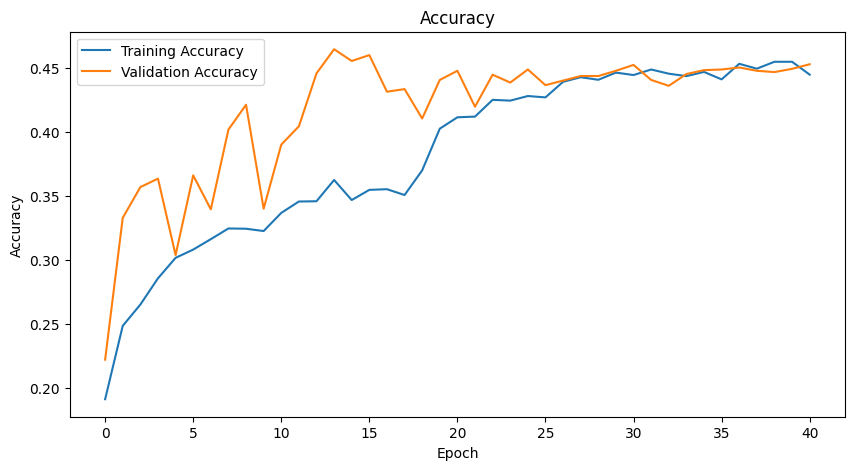

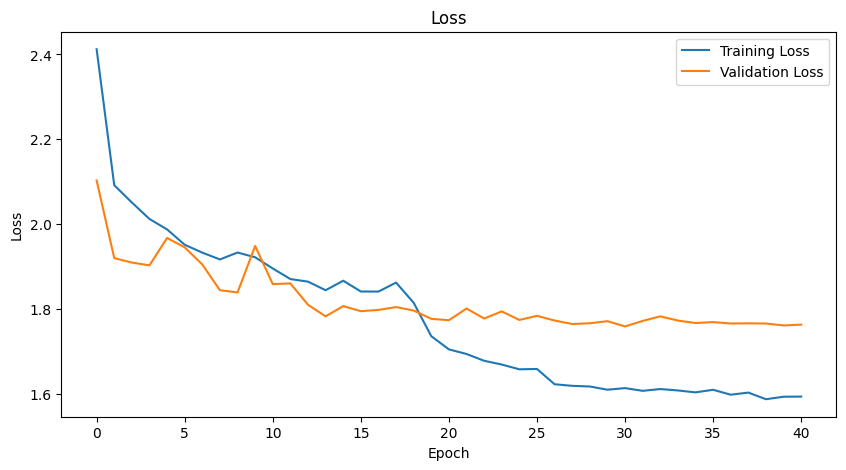

31/31 - 1s - 44ms/step - accuracy: 0.3907 - loss: 1.7960

Test Loss: 1.7960
Test Accuracy: 0.3907


In [ ]:
# Gráficos de precisión y perdida
plot_accuracy_loss(history)

# Validación en el conjunto de prueba
test_loss, test_acc = model.evaluate(test_ds, verbose=2)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

Repetimos para lr=1e-4

Epoch 1/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - accuracy: 0.4444 - loss: 1.6335 - val_accuracy: 0.4261 - val_loss: 1.7834 - learning_rate: 1.0000e-04
Epoch 2/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.4514 - loss: 1.6147 - val_accuracy: 0.4460 - val_loss: 1.7534 - learning_rate: 1.0000e-04
Epoch 3/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.4330 - loss: 1.6163 - val_accuracy: 0.4327 - val_loss: 1.7808 - learning_rate: 1.0000e-04
Epoch 4/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.4420 - loss: 1.6167 - val_accuracy: 0.4388 - val_loss: 1.7782 - learning_rate: 1.0000e-04
Epoch 5/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.4438 - loss: 1.6040 - val_accuracy: 0.4276 - val_loss: 1.7829 - learning_rate: 1.0000e-04
Epoch 6/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - accuracy: 0.4465 - loss: 1.6089 - val_accuracy: 0.4414 - val_loss: 1.7616 - learning_rate: 1.0000e-04
Epoch 7/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/st

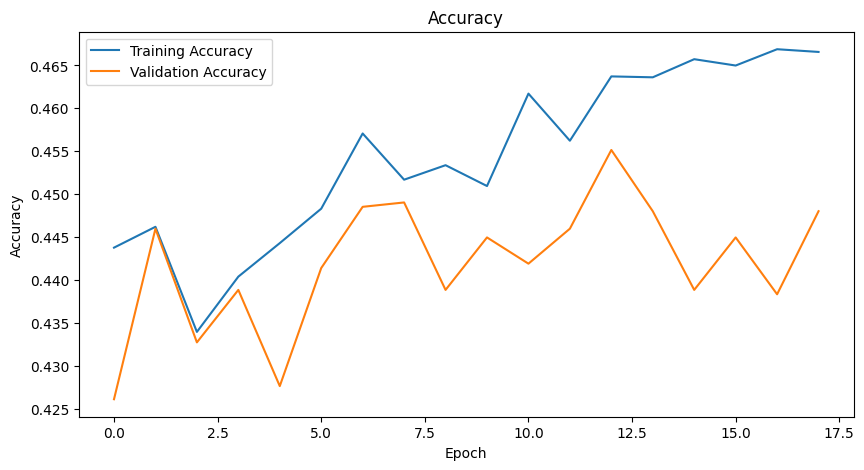

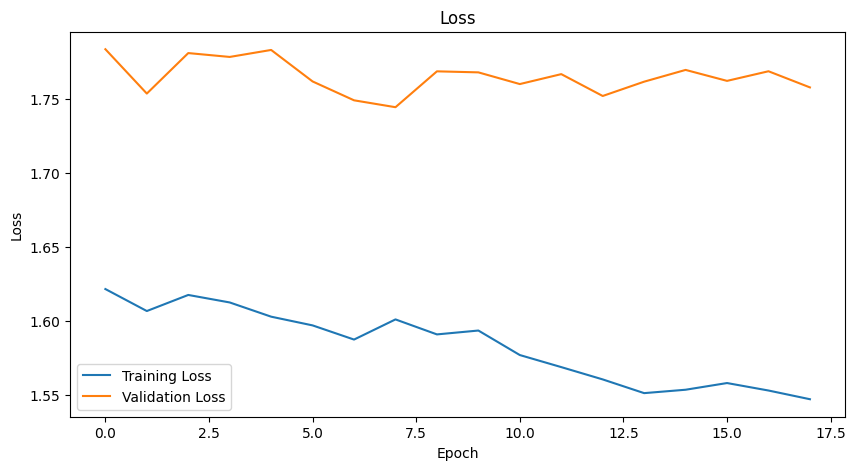

31/31 - 2s - 57ms/step - accuracy: 0.3795 - loss: 1.7955

Test Loss: 1.7955
Test Accuracy: 0.3795


In [ ]:
# Crear un nuevo modelo sin pesos previos

model2 = keras.Model(inputs=inputs, outputs=outputs, name="ANN_model2")


# Compilación del modelo (lr=0.0001)
opt = Adam(learning_rate=0.0001)
model2.compile(
    optimizer=opt,
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)


# Definir callbacks: EarlyStopping --> Igual que antes



# Entrenamiento del modelo
start_time = time.time()
history2 = model2.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks=[stopping, reduce_lr]
)
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")


# Gráficos de precisión y perdida
plot_accuracy_loss(history2)

# Validación en el conjunto de prueba
test_loss2, test_acc2 = model2.evaluate(test_ds, verbose=2)
print(f"\nTest Loss: {test_loss2:.4f}")
print(f"Test Accuracy: {test_acc2:.4f}")


Finalizamos con lr=1e-5

Epoch 1/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.4533 - loss: 1.5759 - val_accuracy: 0.4475 - val_loss: 1.7547 - learning_rate: 1.0000e-05
Epoch 2/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.4579 - loss: 1.5821 - val_accuracy: 0.4475 - val_loss: 1.7563 - learning_rate: 1.0000e-05
Epoch 3/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4603 - loss: 1.5872 - val_accuracy: 0.4393 - val_loss: 1.7611 - learning_rate: 1.0000e-05
Epoch 4/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.4591 - loss: 1.5834 - val_accuracy: 0.4455 - val_loss: 1.7565 - learning_rate: 1.0000e-05
Epoch 5/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - accuracy: 0.4590 - loss: 1.5823 - val_accuracy: 0.4475 - val_loss: 1.7600 - learning_rate: 1.0000e-05
Epoch 6/100
147/148 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.4619 - loss: 1.5597
Epoch 6: ReduceLROnPlateau reducing learning rate to 1.9999999494757505e-06.
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step -

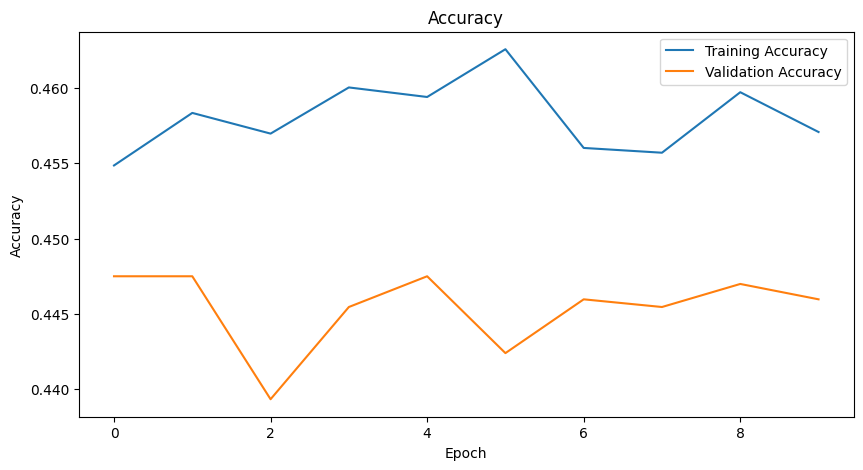

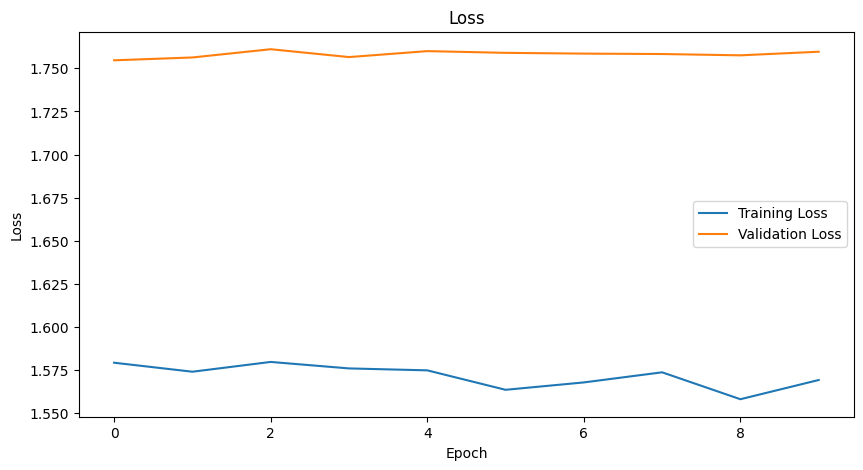

31/31 - 1s - 48ms/step - accuracy: 0.3877 - loss: 1.7885

Test Loss: 1.7885
Test Accuracy: 0.3877


In [ ]:
# Crear un nuevo modelo sin pesos previos

model3 = keras.Model(inputs=inputs, outputs=outputs, name="ANN_model3")


# Compilación del modelo (lr=0.00001)
opt = Adam(learning_rate=0.00001)
model3.compile(
    optimizer=opt,
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)


# Definir callbacks: EarlyStopping --> Igual que antes



# Entrenamiento del modelo
start_time = time.time()
history3 = model3.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks=[stopping, reduce_lr]
)
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")



# Gráficos de precisión y perdida
plot_accuracy_loss(history3)

# Validación en el conjunto de prueba
test_loss3, test_acc3 = model3.evaluate(test_ds, verbose=2)
print(f"\nTest Loss: {test_loss3:.4f}")
print(f"Test Accuracy: {test_acc3:.4f}")



<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
    <ul>
        <li><strong>Forma de las curvas de entrenamiento</strong>:</li>
        <ul>
            <li> Las curvas para lr=1e-3 muestran el proceso de aprendizaje más satisfactorio: ascenso (descenso) paralelo, sustancial y rápido de la precisión (pérdida) en ambas muestras, a un ritmo que desciende hasta alcanzar la época óptima (31), y aplanarse ambas curvas a partir de allí.
            <li> Por el contrario, el proceso de aprendizaje menos satisfactorio lo muestran las cruvas para lr=1er-5: curvas planas tanto de precisión como de pérdida y para ambos conjuntos de datos, indicando claramente que el proceso de optimización que quedado atrapado en mínimo local desde su inicio.  
            <li> En el caso intermedio de lr=1e-4, las curvas muestran resultados igualmente intermedios. En particular, mientras que para la muestra de entrenamiento, hay un suave ascenso (descenso) de la predición (pérdida), las mismas se estancan muy temprano en el caso de la muestra de validación, lo que sugiere que tambi´´en en este caso el proceso puede haber quedado atascado en un mínimo local (en este caso alrededor de la época 8).
        </ul>
        <li><strong>Número de epochs/tiempo de entrenamiento</strong>:
        </li>  
        <ul>
            <li>La reducción de la tasa de aprendizaje reduce el número de épocas (segundos) de aprendizaje de 41 (382) a 18 (149) y luego a 10 (86)</li>
            <li>La mejor época (a la que correspondén los parámetros finales) es la 31, luego la 8 y, con la tasa de aprendizaje más baja, la época 1, sugiriendo que en este último caso el proceso de optimización se quedo estancado en un mínimo local.
        </ul>
        <li><strong>Desempeño del modelo en el conjunto de prueba</strong>:</li>
         <ul>
            <li>Las reducciones de lr han producido cambios apenas apreciables tanto en la precisión como la pérdida en el conjunto de prueba, desde su valor inicial (con lr=0.001) de 39,1%, poco satisfactoria pero superior al 10% de una clasificación al azar.</li>
         </ul>
        <li><strong>Elección final</strong>:</li>
         <ul>
            <li>Me quedaría la tasa de aprendizaje inicial o más alta (1e-3), dado que en su caso se alcanza la mayor precisión en el conjunto de prueba y las curvas sufieren un proceso más satisfactorio de aprendizaje y generalización.</li>
        </ul>
    </ul>
</div>

## 3. Red convolucional pequeña (2 puntos)

Ahora implementaremos una red neuronal convolucional (CNN) básica, que suele ser mucho más efectiva para clasificación de imágenes. Las CNN aprovechan la estructura espacial de los datos mediante capas concretas que permiten extraer características locales antes de la clasificación.

**Arquitectura propuesta**: Usaremos un modelo Keras Sequential para esta CNN. Constará de un bloque extractor de características y luego un clasificador denso similar al anterior pero más pequeño.

En este apartado utilizaremos las capas [Conv2D](https://keras.io/api/layers/convolution_layers/convolution2d/),  [MaxPooling2D](https://keras.io/api/layers/pooling_layers/max_pooling2d/), [Dense](https://keras.io/api/layers/core_layers/dense/) y [Dropout](https://keras.io/api/layers/regularization_layers/dropout/) de Keras.

Se proporciona el código del clasificador ya implementado.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 3.1 [0.5 pts]:</strong> Analiza el siguiente código y describe las capas que forman el bloque extractor de características y el clasificador.</div>

In [ ]:
# Definición del modelo CNN
cnn_model = keras.Sequential([
    InputLayer(shape=(img_height, img_width, 3)),
    Rescaling(1./255),
    Conv2D(16, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(32, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(64, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
], name="CNN_model")
cnn_model.summary()

Model: "CNN_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)              │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 160, 160, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 80, 80, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 80, 80, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 20, 20, 64)          │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 20, 20, 10)          │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,394 (110.91 KB)

 Trainable params: 28,394 (110.91 KB)

 Non-trainable params: 0 (0.00 B)

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Respuesta:</strong>
<br>
 <ul>
     <li><u>Bloque convolucional:</u> (escribe tu respuesta aquí)</li>
        <ul>
            <li><strong>Rescaling(1./255):</strong> Reescalamiento de imágenes (rango pixeles acotados a intervalo [0,1])</li>
            <li><strong>Conv2D(16, 3, padding='same', activation='relu'):</strong> Capa convolucional que aplica 16 filtros de 3x3, el padding necesario para mantener las dimensiones, y finalmente aplica función de activación ReLU. Extrae las características de más bajo nivel.</li>
            <li><strong>MaxPooling2D():</strong> Reduce la dimension de las imágenes de entrada tomando el valor máximo de cada región de 2x2</i>
            <li><strong>Conv2D(32, 3, padding='same', activation='relu'):</strong> Capa convolucional similar a la anterior pero aplica 32 filtros. Extrae características de nivel intermedio.</i>
            <li><strong>MaxPooling2D():</strong> Idem</i>
            <li><strong>Conv2D(64, 3, padding='same', activation='relu'): </strong> Capa convolucional similar a la anterior pero aplica 64 filtros. Extrae características de más alto nivel.</i>
            <li><strong>MaxPooling2D():</strong> Idem</i>
            <li><strong>Dropout(0.2):</strong> Se desactivan un 20% de las neuronas de entrada</i>
        </ul>
     <li><u>Clasificador final:</u> (escribe tu respuesta aquí)</li>
        <ul>
            <li><strong>Dense(64, activation='relu'):</strong> Capa completamente conectada con 64 neuronas y función de activación ReLU, que procesa las características extraídas por el bloque convolucional, seleccionando las que poseen mayor poder discriminatorio.</li>
            <li><strong>Dropout(0.5):</strong>Se desactivan un 50% de las neuronas de entrada</li>
            <li><strong>Dense(10, activation='softmax'):</strong> Capa de salida con diez neuronas asociadas a las diez clases consideradas, y función de activación softmax que arrojara la probabilidad asociada a cada clase.</i>
        </ul>   
 </ul>
</div>

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 3.2 [0.5 pts]:</strong> Compila el modelo con el optimizador <strong>Adam</strong> y <it>learning rate</it> = 1e-4. Entrena el modelo durante <strong>100 épocas</strong>, utilizando:
    <ul>
        <li><em>EarlyStopping</em> monitorizando la pérdida (<em>loss</em>) en validación, con paciencia de 10 épocas, restaurando los mejores pesos obtenidos.</li>
        <li><em>ReduceLROnPlateau</em> monitorizando la pérdida (<em>loss</em>) en validación, factor 0.2, paciencia de 5 épocas y un learning rate mínimo de 1e-6</i>
        <li>La métrica de desempeño <em>accuracy</em> tanto en entrenamiento como validación.</li>
    </ul>

Muestra una gráfica de las curvas de *accuracy* y *loss* para los conjuntos de entrenamiento y validación.

Finalmente, evalúa el modelo entrenado sobre el conjunto de <test>test</test>, mostrando la pérdida y exactitud (<it>accuracy</it>) final obtenidas en dichos datos.

<strong>Nota: durante la ejecución del código se producirá un error.</strong>

Explica a que és debido el error en la ejecución anterior y modifica el modelo para subsanarlo.

<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>
</div>

In [ ]:
# Compilar modelo CNN
cnn_model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
# Definir callbacks EarlyStopping y ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10,
                                restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5,
                                min_lr=1e-6)

In [ ]:
# Entrenamiento del modelo CNN
start_time = time.time()
history4 = cnn_model.fit(train_ds, epochs=100, validation_data=val_ds,
                    callbacks=[early_stopping, reduce_lr])
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")

Epoch 1/100


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None, 10), output.shape=(None, 20, 20, 10)

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br>
        <ul>
        <li>El error se debe a que es necesario vectorizar o aplanar la última salida del <strong>bloque convolucional</strong> para poder ser procesado por el <strong>bloque de clasificación</strong> </li>
    </ul>
</div>

In [ ]:
# Escribe aquí el modelo corregido
cnn_model = keras.Sequential([
    InputLayer(shape=(img_height, img_width, 3)),
    Rescaling(1./255),
    Conv2D(16, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(32, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(64, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.2),
    Flatten(),  # Corrección
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
], name="CNN_model")
cnn_model.summary()

Model: "CNN_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)              │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 160, 160, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 80, 80, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 80, 80, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 64)                  │       1,638,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,662,698 (6.34 MB)

 Trainable params: 1,662,698 (6.34 MB)

 Non-trainable params: 0 (0.00 B)

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 3.3 [0.5 pt]:</strong> Vuelve a repetir el ejercicio anterior (entrenamiento, mostrar gráficas y validación en test) con el modelo corregido. Comenta el tamaño del modelo, el número de epochs/tiempo de entrenamiento, las curvas de  entrenamiento y los resultados de validación.
<br><br>
<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>

</div>

In [ ]:
# Compilar modelo CNN
cnn_model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
# Definir callbacks EarlyStopping y ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10,
                                restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5,
                                min_lr=1e-6)

In [ ]:
# Entrenamiento del modelo CNN
start_time = time.time()
history4 = cnn_model.fit(train_ds, epochs=100, validation_data=val_ds,
                    callbacks=[early_stopping, reduce_lr])
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")

Epoch 1/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - accuracy: 0.1483 - loss: 2.2696 - val_accuracy: 0.3838 - val_loss: 1.9921 - learning_rate: 1.0000e-04
Epoch 2/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.2651 - loss: 2.0445 - val_accuracy: 0.4149 - val_loss: 1.8239 - learning_rate: 1.0000e-04
Epoch 3/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.3373 - loss: 1.9020 - val_accuracy: 0.4297 - val_loss: 1.7229 - learning_rate: 1.0000e-04
Epoch 4/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.3801 - loss: 1.7876 - val_accuracy: 0.4694 - val_loss: 1.6689 - learning_rate: 1.0000e-04
Epoch 5/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.4119 - loss: 1.7141 - val_accuracy: 0.5224 - val_loss: 1.5264 - learning_rate: 1.0000e-04
Epoch 6/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step - accuracy: 0.4330 - loss: 1.6686 - val_accuracy: 0.5652 - val_loss: 1.4303 - learning_rate: 1.0000e-04
Epoch 7/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/st

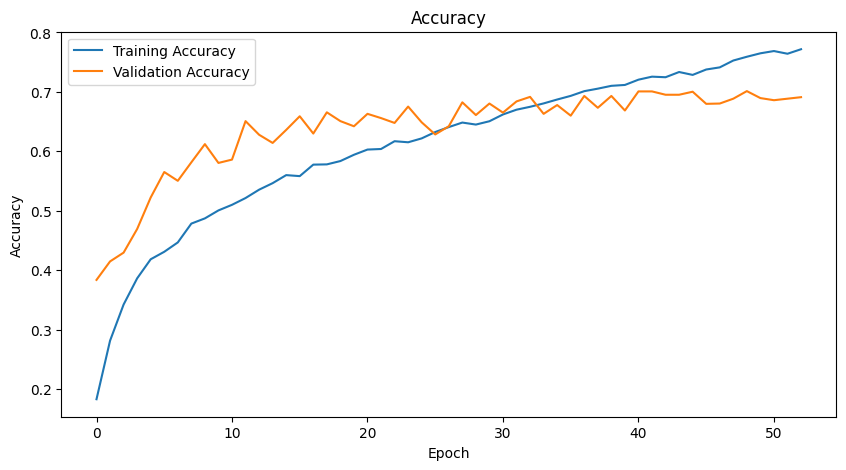

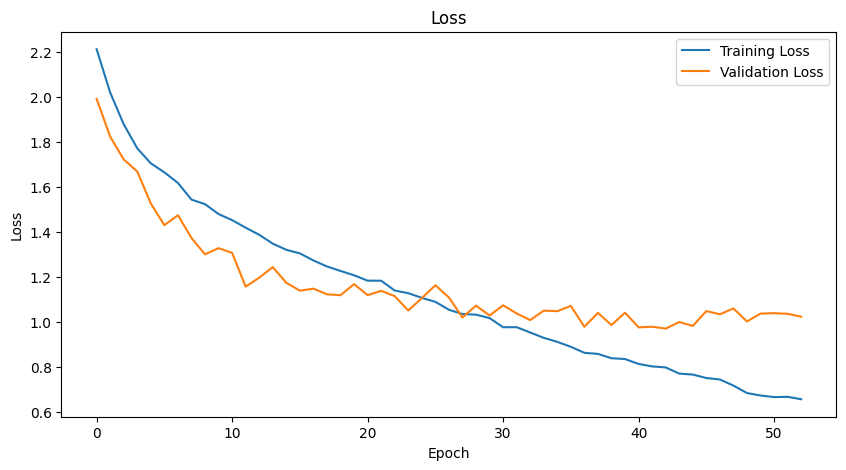

31/31 - 2s - 70ms/step - accuracy: 0.5976 - loss: 1.2507

Test Loss: 1.2507
Test Accuracy: 0.5976


In [ ]:
# Resultados

# Gráficos de precisión y perdida
plot_accuracy_loss(history4)

# Validación en el conjunto de prueba
test_loss4, test_acc4 = cnn_model.evaluate(test_ds, verbose=2)
print(f"\nTest Loss: {test_loss4:.4f}")
print(f"Test Accuracy: {test_acc4:.4f}")

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
        <ul>
        <li>La CNN tiene 1662698 parámetros a estimar
        <li>El entrenamiento tomo 53 épocas (435 segundos), siendo la mejor época la 31 (de la cual se toman los parámetros finales).
        <li>Las curvas de entrenamiento reflejan un proceso satisfactorio de aprendizaje: un apreciable y rápido aumento (reducción) de precisión (pérdida) en ambos conjuntos (train/val), a un ritmo decreciente, hasta alcanzarse la época 31, a partir del cual las curvas se aplanan para el conjunto de validación (de modo que el aprendizaje para las épocas siguientes sobreajusta la red).
        <li>La CNN arroja un precisión del 61,74% (pérdida de 1.25) en el conjunto de prueba, seis veces la precisión correspondiente a un proceso de clasificación al azar.    
    </ul>
</div>

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 3.4 [0.5 pt]:</strong> Realiza una comparativa entre los modelos de los ejercicios 2 (con el learning rate escogido) y 3 en términos de:
<ul>
    <li><strong>Tamaño del modelo</strong></li>
    <li><strong>Evolución del entrenamiento</strong></li>
    <li><strong>Validación en el conjunto de test</strong></li>
    <li><strong>Tiempo de ejecución</strong></li>
</ul>

<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>

</div>

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<ul>
    <li><strong>Tamaño del modelo</strong>:</li>
        <ul>
        <li><em>La CNN contiene 5 capas con parámetros entrenables (incluyendo la salida) contra sólo 3 capas de la ANN.
        <li><em> No obstante, la CNN contiene mucho menos parámetros (1662698) que la ANN (8401930), exactamente 6739232 parámetros menos.  
    </ul>
    <li><strong>Evolución del entrenamiento</strong>:</li>
        <ul>
        <li><em>En ambos casos, las curvas de aprendizaje muestran un aprendizaje satisfactorio (en términos de aprendizaje y generalización) hasta alcanzar la best epoch (la 31 en ambos casos), esto es, hay un continuo aumento (descenso) de la precisión (pérdida) para ambos conjuntos (train/val), a ritmo decreciente, hasta las epoca 31, a partir de donde las curvas se aplanan para el conjunto de validación (con lo que lo que los ajustes posteriores de parámetros pueden considerarse sobreentrenamiento.). </li>
    </ul>
    <li><strong>Validación en el conjunto de test</strong>:</li>
        <ul>
        <li><em>La CNN muestra una precisión (pérdida) mucho más (menos) elevada que la ANN en el conjunto de prueba: 59.76% (1.2507) Versus 39.1% (1.796) </li>
    </ul>
    <li><strong>Tiempo de entrenamiento</strong>:</li>
        <ul>
        <li>La CNN tomó más épocas y tiempo para su entrenamiento (53 épocas, 434.85 segundos) que la ANN (41 épocas, 381.6 segundos), esto es un 13.95% más de tiempo y un 29.27% más de épocas.</li>
    </ul>
</ul>
</div>

## 4. Aumentación de los datos (1 punto)

Aunque la CNN entrenada es bastante efectiva, podemos intentar mejorar su generalización aumentando artificialmente el tamaño y la diversidad del conjunto de entrenamiento mediante **técnicas de aumentación de datos**. La aumentación consiste en aplicar transformaciones aleatorias a las imágenes (giros, rotaciones, zoom, etc.) de modo que el modelo reciba variantes de las imágenes originales en cada época, simulando tener más datos

Keras proporciona capas de preprocesamiento de imagen que realizan estas transformaciones de forma eficiente durante el entrenamiento, por ejemplo RandomFlip, RandomRotation, RandomZoom entre otras.

Aquí utilizaremos algunas de estas capas para implementar la aumentación. En particular, probaremos con voltear horizontalmente las imágenes y aplicar pequeñas rotaciones aleatorias.

### 4.1. Definición y visualización de la aumentación

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 4.1 [0.5 pts]:</strong> Crea un modelo <strong>Sequential</strong> de Keras que represente una capa de aumentación de datos con las siguientes capas:
    <ul>
        <li><code>RandomFlip</code> que voltee aleatoriamente las imágenes horizontalmente.</li>
        <li><code>RandomRotation</code> con factor de rotación de 0.1 (±10%).</li>
    </ul>
Selecciona una imagen del conjunto de entrenamiento y pásala a través de este modelo varias veces, mostrando las imágenes resultantes para comprobar visualmente las transformaciones realizadas (volteos y rotaciones). </div>

In [ ]:
# Modelo de aumentación de datos
data_augmentation = keras.Sequential([
    InputLayer(shape=(img_height, img_width, 3)),
    RandomFlip("horizontal"),  # Volteo horizontal aleatorio
    RandomRotation(0.1),  # Rotación aleatoria (±10%)
], name="data_augmentation")

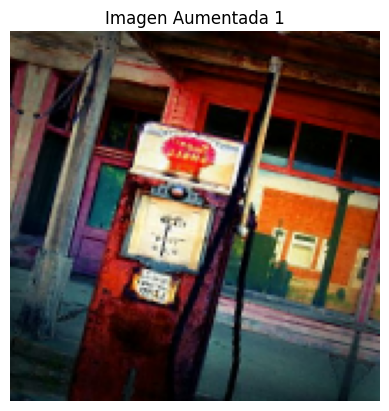

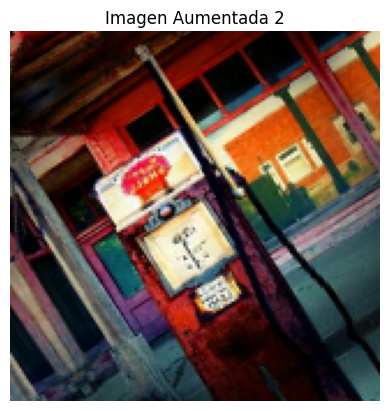

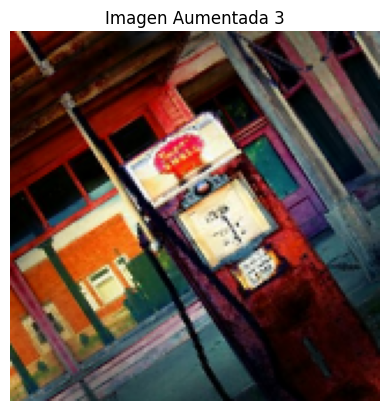

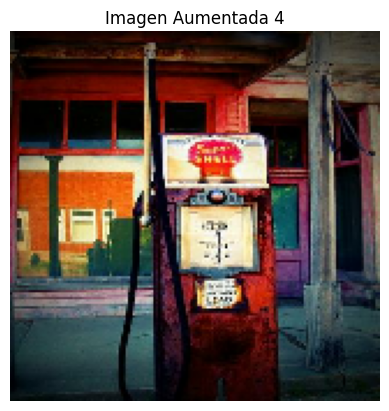

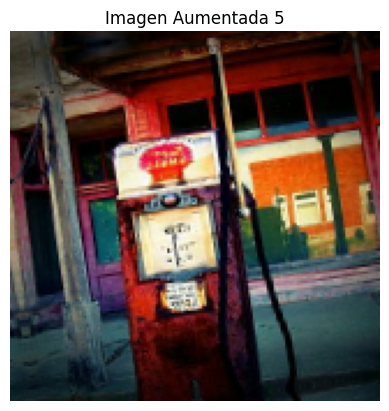

In [ ]:
# Tomar un batch de entrenamiento y obtener una imagen

#* Selecciona una imagen del conjunto de entrenamiento
for images, labels in train_ds.take(1):  # Toma un batch del conjunto de entrenamiento
    image = images[0]  # Selecciona la primera imagen del batch
    break  # Sale del bucle

#* Convierte la imagen a un array NumPy
image_np = image.numpy().astype(np.uint8)

# Aplicar aumentación varias veces y visualizar


num_augmentations = 5  # Número de veces que se aplicará el aumento de datos
for i in range(num_augmentations):
    augmented_image = data_augmentation(tf.expand_dims(image, 0))  # Expande la dimensión de la imagen para que sea compatible con el modelo
    augmented_image_np = augmented_image[0].numpy().astype(np.uint8)  # Convierte la imagen aumentada a un array NumPy
    # Muestra la imagen aumentada
    plt.figure()
    plt.imshow(augmented_image_np)
    plt.title(f"Imagen Aumentada {i + 1}")
    plt.axis("off")
    plt.show()

### 4.2. Entrenamiento de la CNN con aumentación

Ahora incorporaremos la capa de aumentación al modelo CNN para entrenarlo con datos aumentados en cada época.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 4.2 [0.5 pts]:</strong> Inserta el modelo de aumentación de datos creado entre la capa de <code>Rescaling</code> y la primera <code>Conv2D</code> del modelo CNN anterior. Es decir, modifica la arquitectura para que las imágenes de entrada, tras ser reescaladas, pasen por las capas de <em>flip</em> y <em>rotation</em> aleatorias, y luego continúen por la CNN. A continuación, compila y entrena el nuevo modelo CNN aumentado siguiendo las mismas indicaciones que en el ejercicio anterior, <strong>excepto</strong> que esta vez usaremos un <strong>learning rate</strong> inicial mayor (1e-3). Mantén EarlyStopping, ReduceLROnPlateau, 100 épocas, etc. Luego evalúa el modelo final en el conjunto de test.

Comenta las diferencias con el modelo sin aumentación en términos de:

<ul>
    <li><strong>Evolución de las curvas de entrenamiento</strong></li>
    <li><strong>Validación en el conjunto de test</strong></li>
    <li><strong>Tiempo de entrenamiento</strong></li>
    <li><strong>Learning rate</strong></li>
</ul>

<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>

</div>

In [ ]:
# Modelo CNN con aumentación de datos
cnn_model_augmented = keras.Sequential([
    InputLayer(shape=(img_height, img_width, 3)),
    Rescaling(1./255),
    data_augmentation, # modelo de aumentación de datos
    Conv2D(16, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(32, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(64, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.2),
    Flatten(),  # Corrección
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
], name="CNN_model")

cnn_model_augmented.summary()


Model: "CNN_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_5 (Rescaling)              │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 160, 160, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 80, 80, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 80, 80, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 25600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 64)                  │       1,638,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,662,698 (6.34 MB)

 Trainable params: 1,662,698 (6.34 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compilación de la red
cnn_model_augmented.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
# Entrenamiento
start_time = time.time()
history5 = cnn_model_augmented.fit(train_ds, epochs=100, validation_data=val_ds,
                    callbacks=[early_stopping, reduce_lr])
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")

Epoch 1/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - accuracy: 0.1471 - loss: 2.2733 - val_accuracy: 0.1784 - val_loss: 2.1666 - learning_rate: 1.0000e-04
Epoch 2/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.2469 - loss: 2.0898 - val_accuracy: 0.2421 - val_loss: 1.9802 - learning_rate: 1.0000e-04
Epoch 3/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - accuracy: 0.2956 - loss: 1.9732 - val_accuracy: 0.3196 - val_loss: 1.8731 - learning_rate: 1.0000e-04
Epoch 4/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step - accuracy: 0.3261 - loss: 1.8985 - val_accuracy: 0.4108 - val_loss: 1.7355 - learning_rate: 1.0000e-04
Epoch 5/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.3599 - loss: 1.8336 - val_accuracy: 0.4399 - val_loss: 1.6748 - learning_rate: 1.0000e-04
Epoch 6/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - accuracy: 0.3837 - loss: 1.7860 - val_accuracy: 0.4964 - val_loss: 1.5888 - learning_rate: 1.0000e-04
Epoch 7/100
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms

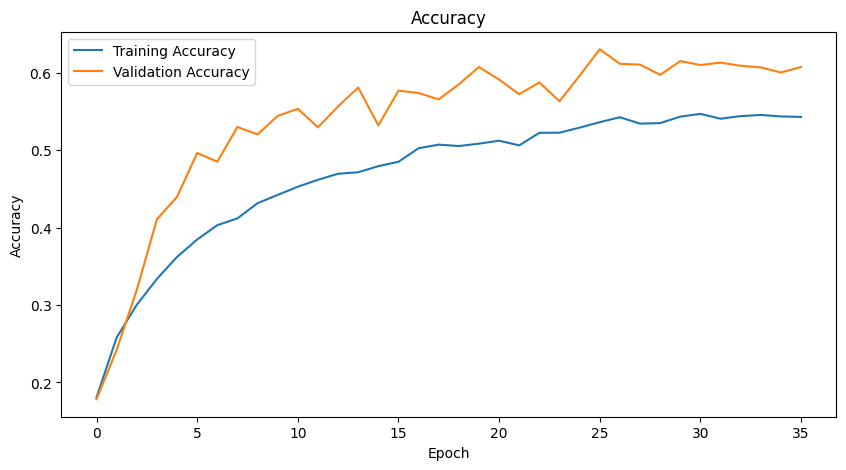

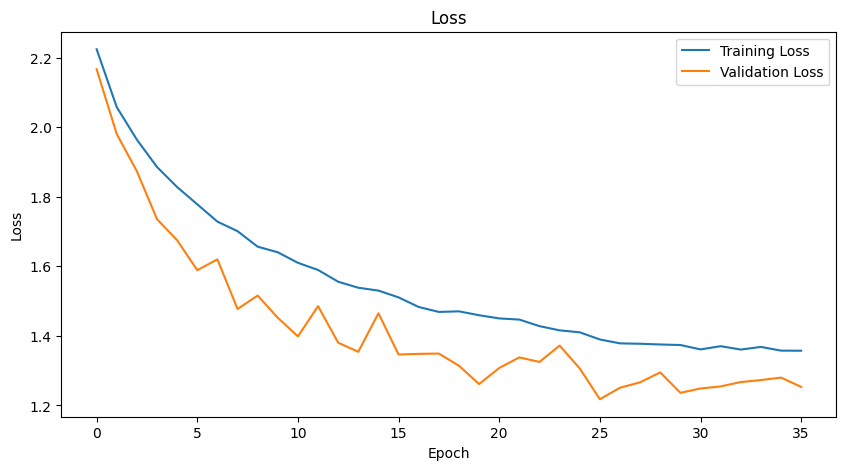

31/31 - 3s - 84ms/step - accuracy: 0.5976 - loss: 1.2823

Test Loss: 1.2823
Test Accuracy: 0.5976


In [ ]:
# Resultados

# Gráficos de precisión y perdida
plot_accuracy_loss(history5)

# Validación en el conjunto de prueba
test_loss5, test_acc5 = cnn_model_augmented.evaluate(test_ds, verbose=2)
print(f"\nTest Loss: {test_loss5:.4f}")
print(f"Test Accuracy: {test_acc5:.4f}")

Comenta las diferencias con el modelo sin aumentación en términos de:
<ul>
    <li><strong>Evolución de las curvas de entrenamiento</strong></li>
    <li><strong>Validación en el conjunto de test</strong></li>
    <li><strong>Tiempo de entrenamiento</strong></li>
    <li><strong>Learning rate</strong></li>
</ul>

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>

<ul>
    <li><strong>Evolución de las curvas de entrenamiento</strong>:</li>
    <ul>
        <li>La diferencia más notable entre las curvas de entrenamiento de CNN y CNNA (CNN_AUMENTADO) es que en el segundo caso sólo se interceptan  en el caso de la precisión y sólo en la épocas iniciales.
        <li>Por lo demás las curvas muestran un proceso de aprendizaje y generalización satisfactorio en ambos modelos hasta la mejor época (31 en ambos modelos), a partid de la cual las curvas para la muestra de validación se aplana.
    </ul>
    <li><strong>Validación en el conjunto de test</strong>:</li>
            <ul>
        <li> CNN y CNNA muestran un desempeño predictivo similar en el conjunto de prueba con una precisión idéntica (59.76%) y una perdida sólo marginalmente superior para la CNNA (1.2507 Versus 1.2823).
        <li>En definitiva, la aumentación no aportó ganancias en términos de desempeño predictivo en conjunto de prueba.
    </ul>
    <li><strong>Tiempo de entrenamiento</strong>:</li>
            <ul>
        <li>El entrenamiento de la CNNA tomó menos tiempo y épocas que la CNN: 36 épocas y 323.93 segundos versus 53 épocas y 434.85 segundos.
        <li>En definitiva, la aumentación de datos sí aporto ganancias en términos de reducción del tiempo de convergencia (sin pérdida de capacidad de generalización).
    </ul>
</ul>

</div>

## 5. Superresolución de imágenes con CNNs (2 pts)

Hasta ahora hemos trabajado en un problema de **clasificación**. En los apartados restantes abordaremos un problema distinto pero relacionado con la visión: la **superresolución de imágenes**. La superresolución consiste en generar una imagen de alta resolución (HR) a partir de una de baja resolución (LR), intentando recuperar o inferir los detalles perdidos al reducir la imagen. Es un problema de aprendizaje supervisado donde el modelo aprende una transformación imagen -> imagen.

Usaremos nuevamente la base de datos Imagenette para crear ejemplos de entrenamiento: a partir de cada imagen original (320px) generaremos una versión reducida (p. ej. 80px) que servirá como entrada, teniendo como salida esperada la imagen original. De este modo, el modelo aprenderá a mapear de baja a alta resolución. En lugar de una red convolucional para clasificación, necesitaremos una red capaz de procesar una imagen de entrada y producir una imagen de salida. Las **capas transpuestas de convolución** ([Conv2DTranspose](https://keras.io/api/layers/convolution_layers/convolution2d_transpose/)) o técnicas de upsampling son las piezas clave para estos modelos, ya que permiten aumentar las dimensiones espaciales de los datos.

A continuación, crearemos el conjunto de datos para superresolución y entrenaremos una **CNN de superresolución simple**.

### 5.1. Preparación de datos LR/HR

Primero generaremos los pares de imágenes de entrenamiento y validación para superresolución. Partiremos de las imágenes originales de entrenamiento (y validación) a su resolución completa y, por simplicidad, las redimensionaremos a un tamaño fijo de 320×320 (ignorando la relación de aspecto original, similar a lo hecho en clasificación) para utilizarlas como imágenes de referencia de alta resolución (HR), y las reduciremos a 1/4 de su tamaño (aprox. 80×80) para usarlas como imágenes de entrada de baja resolución (LR). Para realizar ambas transformaciones (ajuste de las imágenes originales a 320x320 y su reducción a 80x80) utilizaremos métodos de [interpolación bicúbica](https://es.wikipedia.org/wiki/Interpolaci%C3%B3n_bic%C3%BAbica) para simular imágenes degradas suavemente.


Procedemos a obtener las rutas de imágenes de entrenamiento y validación, luego creamos un Dataset aplicando la función de mapeo que realiza la lectura y transformación:

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 5.1.1 [0.5 pt]:</strong> El siguiente código prepara un nuevo conjunto de datos a partir de las imágenes de entrenamiento originales. Cada ejemplo consistirá en una imagen de baja resolución (LR) y su correspondiente imagen de alta resolución (HR). Concretamente, toma las imágenes de <code>/train/</code> (para crear los subconjuntos de entrenamiento y validación) a su tamaño completo (320px) como HR, y genera imágenes LR reduciéndolas a 1/4 de su tamaño lineal (∼80×80). Se pide:
<ul>
    <li>Completa los comentarios del código en aquellos sitios donde está marcado (#Poner comentario).</li>
</ul>
</div>

In [ ]:
# Preprocesando las imágenes de filepath para un ejercició de superresolución
def preprocess_image_for_sr(filepath):
    # Lee una imagen de filepath y la convierte en tensor
    img = tf.io.read_file(filepath)
    img = tf.image.decode_jpeg(img, channels=3)
    # Convierte la imagen (los pixeles) a formato float32
    img = tf.image.convert_image_dtype(img, tf.float32)
    # Redimensionando las imágenes a la resolución deseada (lr el input y hr el output)
    hr = tf.image.resize(img, [320, 320], method=tf.image.ResizeMethod.BICUBIC)
    lr = tf.image.resize(img, [80, 80], method=tf.image.ResizeMethod.BICUBIC)
    # Reescalando las imágenes (los píxeles) al rango [0,1]
    hr = tf.clip_by_value(hr, 0.0, 1.0)
    lr = tf.clip_by_value(lr, 0.0, 1.0)
    return lr, hr

# Auxiliar: Guarda etiquetas de clase en lista con nombre "train_classes" utilizada a continuación
train_classes = train_ds.class_names # se guardan las etiquetas de clase en la variable usan a continuación


# almacenan las rutas a las imágenes de las carpetas (una para cada clase) del directorio train_dir en dos listas ("train_files" y "val_files")
train_files = []
val_files = []
for cls in train_classes:
    cls_files = sorted(Path(os.path.join(train_dir, cls)).glob("*.*"))
    #  Cálculo índice para dividir las rutas de cada carpeta (clase) en 80% para training y 20% para validación
    split_idx = int(len(cls_files) * 0.2)
    val_files += [str(p) for p in cls_files[:split_idx]]
    train_files += [str(p) for p in cls_files[split_idx:]]
random.shuffle(train_files)
random.shuffle(val_files)



# Crear los datasets de entrenamiento y validación para los siguientes ejercicios de superresolución
train_sr_ds = tf.data.Dataset.from_tensor_slices(train_files).map(preprocess_image_for_sr, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(tf.data.AUTOTUNE)
val_sr_ds   = tf.data.Dataset.from_tensor_slices(val_files).map(preprocess_image_for_sr, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(tf.data.AUTOTUNE)



In [ ]:
# VERIFICANDO HOMOGENEIDAD DE LAS DIMENSIONES DE LAS IMÁGENES (en especial batch_size)

# Iterate through the dataset and check properties
for i, (lr, hr) in enumerate(train_sr_ds):
    # Check shapes
    if lr.shape != (32,80, 80, 3) or hr.shape != (32,320, 320, 3):
        print(f"Image {i} has unexpected shape: lr={lr.shape}, hr={hr.shape}")

    # Check data type
    if lr.dtype != tf.float32 or hr.dtype != tf.float32:
        print(f"Image {i} has unexpected data type: lr={lr.dtype}, hr={hr.dtype}")

    # Check pixel value range
    if tf.reduce_min(lr) < 0.0 or tf.reduce_max(lr) > 1.0 or \
       tf.reduce_min(hr) < 0.0 or tf.reduce_max(hr) > 1.0:
        print(f"Image {i} has pixel values outside [0, 1]")

Image 236 has unexpected shape: lr=(26, 80, 80, 3), hr=(26, 320, 320, 3)


# ADVERTENCIA:
##### * La no homogeneidad los batches, generaba problemas en el entrenamiento (cuando epochs era mayor que 50)
##### * Se optó por ello por eliminar el último batch (batch_size=26), incluyendo la opción "drop_remainder=True" en las últimas dos líneas de código anterior

##### * Ello explica que el número de batches en el entrenamiento de los modelos siguientes sea de 236 en lugar de 237 (=7578/32)

In [ ]:
# Preprocesando las imágenes de filepath para un ejercició de superresolución
def preprocess_image_for_sr(filepath):
    # Lee una imagen de filepath y la convierte en tensor
    img = tf.io.read_file(filepath)
    img = tf.image.decode_jpeg(img, channels=3)
    # Convierte la imagen (los pixeles) a formato float32
    img = tf.image.convert_image_dtype(img, tf.float32)
    # Redimensionando las imágenes a la resolución deseada (lr el input y hr el output)
    hr = tf.image.resize(img, [320, 320], method=tf.image.ResizeMethod.BICUBIC)
    lr = tf.image.resize(img, [80, 80], method=tf.image.ResizeMethod.BICUBIC)
    # Reescalando las imágenes (los píxeles) al rango [0,1]
    hr = tf.clip_by_value(hr, 0.0, 1.0)
    lr = tf.clip_by_value(lr, 0.0, 1.0)
    return lr, hr

# Auxiliar: Guarda etiquetas de clase en lista con nombre "train_classes" utilizada a continuación
train_classes = train_ds.class_names # se guardan las etiquetas de clase en la variable usan a continuación


# almacenan las rutas a las imágenes de las carpetas (una para cada clase) del directorio train_dir en dos listas ("train_files" y "val_files")
train_files = []
val_files = []
for cls in train_classes:
    cls_files = sorted(Path(os.path.join(train_dir, cls)).glob("*.*"))
    #  Cálculo índice para dividir las rutas de cada carpeta (clase) en 80% para training y 20% para validación
    split_idx = int(len(cls_files) * 0.2)
    val_files += [str(p) for p in cls_files[:split_idx]]
    train_files += [str(p) for p in cls_files[split_idx:]]
random.shuffle(train_files)
random.shuffle(val_files)


#* Se incluye "drop_remainder=True" para impedir incluir imágenes de tamaño no homogéneo (distinto a batch_size=32)
#* Para ello se desecha el último batch si, como en este caso, batch_size<32
train_sr_ds = tf.data.Dataset.from_tensor_slices(train_files).map(preprocess_image_for_sr, num_parallel_calls=tf.data.AUTOTUNE).batch(32,drop_remainder=True).prefetch(tf.data.AUTOTUNE)
val_sr_ds   = tf.data.Dataset.from_tensor_slices(val_files).map(preprocess_image_for_sr, num_parallel_calls=tf.data.AUTOTUNE).batch(32,drop_remainder=True).prefetch(tf.data.AUTOTUNE)


Procedemos a verificar la base de datos:

LR shape: (80, 80, 3) HR shape: (320, 320, 3)
LR pixel range: 0.0 - 1.0
HR pixel range: 0.0 - 1.0


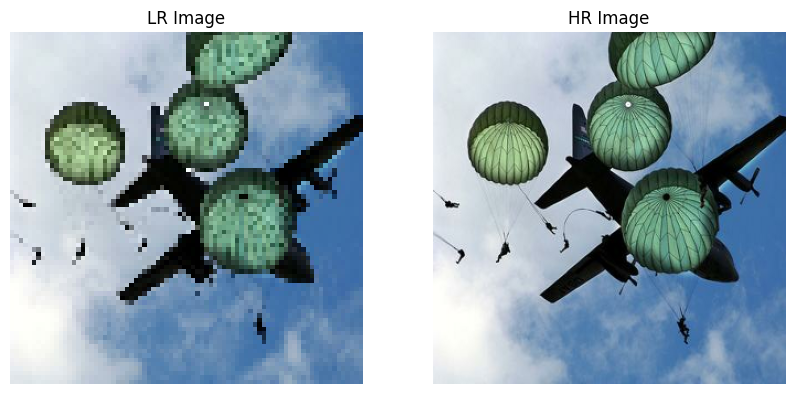

In [ ]:
# Verificación de un par LR-HR
for lr, hr in train_sr_ds.take(1):
    lr = lr[0].numpy()
    hr = hr[0].numpy()
    print("LR shape:", lr.shape, "HR shape:", hr.shape)
    print("LR pixel range:", lr.min(), "-", lr.max())
    print("HR pixel range:", hr.min(), "-", hr.max())
    break

# Extra: Verificación visual de un ejemplo de lr y otro de hr
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("LR Image")
plt.imshow(lr)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("HR Image")
plt.imshow(hr)
plt.axis("off")

plt.show()


<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 5.1.2 [0.5 pt]:</strong> Contesta a las siguientes preguntas:
<ul>
    <li>¿A qué puede deberse el uso de la función 'clip_by_value' en el código anterior?</li>
    <li>¿Cómo se divide la base de datos? ¿Qué directorio se utiliza para su creación?¿Qué subconjuntos se crean? ¿Qué porcentaje de imágenes se asigna a cada conjunto? ¿Y en número de imágenes?</li>
    <li>Para cada elemento del conjunto de datos ¿qué formato tienen los datos que usaremos para entrenar el modelo? ¿y sus etiquetas?</li>
</ul>
<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>
</div>

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
 <ul>
    <li><strong>Función 'clip_by_value'</strong>:  (escribe tu respuesta aquí)</li>
            <ul>
                <li>Se encarga de reescalar la dimensión en píxeles de cada celda a la escala [0,1] por las razones usuales.</li>
            </ul></li>
    <li><strong>Subconjuntos de la base de datos</strong>:  
    <ul>
                <li>Se utilizan sólo las imágenes del subdirectorio "train".</li>
                <li>Las imágenes de cada carpeta del subdirectorio train se dividen en 20% para validación (1891 imágenes) y 80% (7578 imágenes) para entrenamiento, y sus correspondientes rutas se guardan secuencialmente en las listas "val_files" y "train_files" respectivamente.</li>
    </ul></li>    
    <li><strong>Formato de los datos y etiquetas</strong>:      
    <ul>
                <li>Cada elemento es una dupla de tensores que contienen imagen de baja resolución "lr" (input) y una imagen de alta resolución "hr" (output o etiqueta).</li>
                <li> "lr" es un tensor de dimensiones (32,80,80,3) y "hr" uno de dimensiones (32,320,320,3), con los pixeles expresados en ambos casos en formato "float32"
                </li>
    </ul></li>   
</ul>
</div>

In [ ]:
# Extra: Número de imágenes asociadas a train_files y val_files
print(len(train_files))
print(len(val_files))

# Extra: Mostrar dimensiones y formato de imágenes típicas
for lr, hr in train_sr_ds.take(1):  # Tomar 1 batch para ilustración
    print("Low-resolution image shape:", lr.shape)
    print("Low-resolution image dtype:", lr.dtype)
    print("High-resolution image shape:", hr.shape)
    print("High-resolution image dtype:", hr.dtype)
    break # Salir

7578
1891
Low-resolution image shape: (32, 80, 80, 3)
Low-resolution image dtype: <dtype: 'float32'>
High-resolution image shape: (32, 320, 320, 3)
High-resolution image dtype: <dtype: 'float32'>


### 5.2. Implementación del modelo de Superresolución

Ahora definimos un modelo CNN para superresolución. Optaremos por una arquitectura simple con [UpSampling2D](https://keras.io/api/layers/reshaping_layers/up_sampling2d/) para escalar la imagen gradualmente. Implementamos el modelo:

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 5.2 [1 pt]:</strong> Vamos a entrenar un modelo CNN para superresolución 4× (de 80px a 320px). Para ello:
    <ul>
        <li>Implementa un modelo de superresolución en Keras. Puedes usar el API funcional o Sequential. Sugerencia de arquitectura sencilla:
            <ul>
                <li>Entrada con shape (80,80,3).</li>
                <li>Varias capas Conv2D para extraer características en la resolución baja.</li>
                <li>Capa de <code>UpSampling2D</code> (factor=2) o <code>Conv2DTranspose</code> con <code>stride=2</code> para doblar el ancho y alto (80->160).</li>
                <li>Otra capa Conv2D para refinar, seguida de otra capa de upsampling 2× (160->320).</li>
                <li>Capas Conv2D finales para reconstruir la imagen de salida de 320×320×3. (Puedes usar activación lineal o ReLU para la salida; considera que buscamos valores de pixel entre 0-1 o 0-255).</li>
            </ul></li>
        <li>Compila el modelo con una función de pérdida apropiada para imágenes (por ejemplo, MSE) y sin métricas de accuracy. Entrénalo durante ~50-100 épocas, con EarlyStopping (paciencia 5-10, monitorizando val_loss) para asegurarte de no sobreentrenar.</li>
        <li>Comenta los resultados del entrenamiento. Concretamente:
            <ul>
                <li>Las curvas de entrenamiento.</li>
                <li>El tiempo de entrenamiento vs Tamaño del modelo.</li>
            </ul>                
        </li>
    </ul>
<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>
</div>

In [ ]:
# Modelo de Super-Resolución (80px -> 320px) con UpSampling2D (factor=2)

srcnn1_model = keras.Sequential([
    InputLayer(shape=(80, 80, 3)),  # Entrada 80x80x3
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    UpSampling2D(size=(2, 2)),  # Upsampling a 160x160
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    UpSampling2D(size=(2, 2)),  # Upsampling a 320x320
    Conv2D(3, (3, 3), activation='sigmoid', padding='same')  # Salida 320x320x3
], name="srcnn1_model")

# Mostrar la estructura del modelo
srcnn1_model.summary()





Model: "srcnn1_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)                   │ (None, 80, 80, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 80, 80, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 160, 160, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 160, 160, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 320, 320, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_18 (Conv2D)                   │ (None, 320, 320, 3)         │             867 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 58,051 (226.76 KB)

 Trainable params: 58,051 (226.76 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compilación de la red
srcnn1_model.compile(optimizer='adam', loss='mse') # la learning rate por defecto de optimizador Adam en Keras es 0.001



In [ ]:
# Definir EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenamiento de la red
start_time = time.time()
historysr1 = srcnn1_model.fit(
    train_sr_ds,
    epochs=50,
    validation_data=val_sr_ds,
    callbacks=[early_stopping]
)
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")


Epoch 1/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.0251 - val_loss: 0.0068
Epoch 2/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0068 - val_loss: 0.0065
Epoch 3/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0064 - val_loss: 0.0061
Epoch 4/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.0063 - val_loss: 0.0060
Epoch 5/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0062 - val_loss: 0.0060
Epoch 6/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.0061 - val_loss: 0.0060
Epoch 7/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.0061 - val_loss: 0.0059
Epoch 8/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0061 - val_loss: 0.0059
Epoch 9/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0060 - val_loss: 0.0059
Epoch 10/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0060 - val_loss: 0.0058
Epoch 11/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0060 - val_loss: 0.0058
Epoch 12/50
237/237 ━━━━━━━━━━

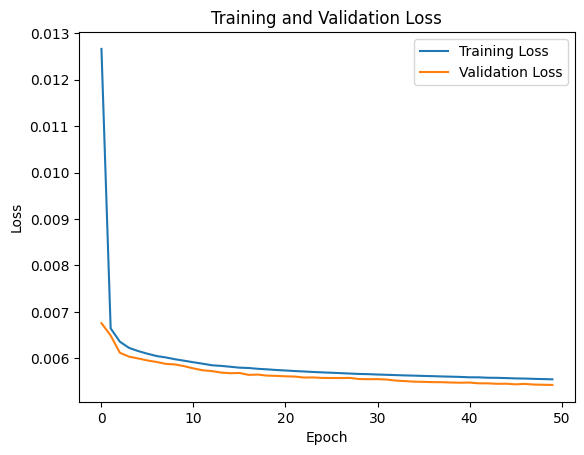

In [ ]:
# Resultados: Curva de pérdida (loss)
plt.plot(historysr1.history['loss'], label='Training Loss')
plt.plot(historysr1.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()



In [ ]:

# Extra: # Modelo de Super-Resolución (80px -> 320px) con Conv2DTranspose(stride=2)
srcnn2_model = keras.Sequential([
    InputLayer(shape=(80, 80, 3)),  # Entrada 80x80x3
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    # Utilizando Conv2DTranspose
    Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu', padding='same'),  # incremento a 160x160
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    # Utilizando Conv2DTranspose
    Conv2DTranspose(32, (3, 3), strides=(2, 2), activation='relu', padding='same'),  # incremento a 320x320
    Conv2D(3, (3, 3), activation='sigmoid', padding='same')  # Salida 320x320x3
], name="srcnn2_model")

# Mostrar la estructura del modelo
srcnn2_model.summary()


Model: "srcnn2_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_19 (Conv2D)                   │ (None, 80, 80, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 80, 80, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 160, 160, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 160, 160, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 320, 320, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 320, 320, 3)         │             867 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 104,227 (407.14 KB)

 Trainable params: 104,227 (407.14 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - loss: 0.0367 - val_loss: 0.0079
Epoch 2/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0075 - val_loss: 0.0064
Epoch 3/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0065 - val_loss: 0.0062
Epoch 4/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0062 - val_loss: 0.0063
Epoch 5/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.0060 - val_loss: 0.0058
Epoch 6/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0059 - val_loss: 0.0059
Epoch 7/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0058 - val_loss: 0.0057
Epoch 8/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0058 - val_loss: 0.0057
Epoch 9/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.0058 - val_loss: 0.0056
Epoch 10/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0058 - val_loss: 0.0057
Epoch 11/50
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0057 - val_loss: 0.0056
Epoch 12/50
237/237

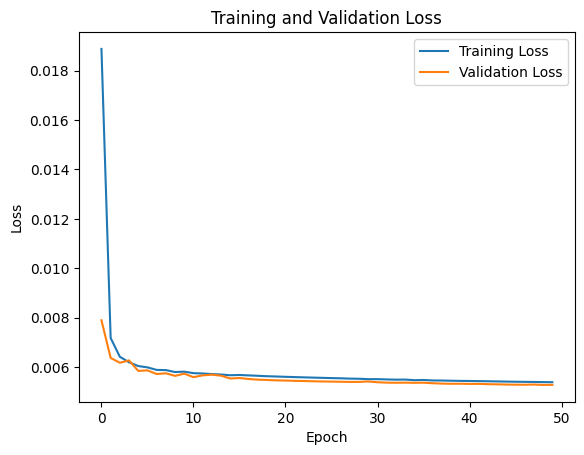

In [ ]:

# Compilación de la red
srcnn2_model.compile(optimizer='adam', loss='mse')

# Definir EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenamiento de la red
start_time = time.time()
historysr2 = srcnn2_model.fit(
    train_sr_ds,
    epochs=50,
    validation_data=val_sr_ds,
    callbacks=[early_stopping]
)
end_time = time.time()
total_time = end_time - start_time
print(f"Tiempo total de entrenamiento: {total_time} segundos")



# Resultados: Curva de pérdida (loss)
plt.plot(historysr2.history['loss'], label='Training Loss')
plt.plot(historysr2.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()



<li>Comenta los resultados del entrenamiento. Concretamente:
            <ul>
                <li>Las curvas de entrenamiento.</li>
                <li>El tiempo de entrenamiento vs Tamaño del modelo.</li>
            </ul>                
        </li>

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>  Se estimaron dos modelos SRCNN1(UpSampling2D)  y SRCNN2(Conv2DTranspose)
<br><br>
<ul>
    <li><strong>Las curvas de entrenamiento</strong>:   (escribe tu respuesta aquí)</li>
     <ul>
          <li>Para ambos modelos, las curvas de entrenamiento (Loss) para los subconjuntos train y val resultaron paralelas y descendentes (a ritmo descendente) a lo largo de todas las épocas consideradas (100).
          <li>Por tanto el proceso de entrenamiento puede considerarse muy satisfactorio en términos tanto de ajuste como de generalización, si bien las reducciones de la pérdida se hacen prácticamente insignificantes al acercarse a las 100 épocas (aunque no lo suficiente para que se activa el early stopping).
          .</li>
    </ul>
    <li><strong>El tiempo de entrenamiento vs Tamaño del modelo</strong>:   (escribe tu respuesta aquí)</li>
     <ul>
          <li> El modelo SRCNN2 (104227 parámetros entrenables) es de tamaño considerablemente mayor que el modeo SRCNN1 (58051  parámetros entrenables), dado los parámetros entrenables que añaden las dos capas convolucionales transpuestas (46176), casi un 80% más de parámetros.</li>
          <li> Consecuentemente el modelo SRCCN2 toma casi un 57% más de tiempo (2429 segundos) que el modelo SRCNN1 (1547 segundos)</li>
    </ul>
</ul>
</div>

## 6. Inferencia, métricas y visualización de resultados (1 punto)

Con el modelo de superresolución entrenado, evaluaremos su desempeño tanto cuantitativamente (con métricas) como cualitativamente (visualizando imágenes). Para ello realizaremos la inferencia: esto es, tomar imágenes LR de test, pasarlas por el modelo sr_model para obtener imágenes superresueltas, y compararlas con las HR originales. Calcularemos la métrica [PSNR (Peak Signal-to-Noise Ratio)](https://es.wikipedia.org/wiki/PSNR) para cuantificar la calidad.

PSNR se mide en decibelios (dB) y valores más altos indican mayor similitud con la imagen original (por ejemplo, >30 dB suele indicar muy buena calidad de reconstrucción).

También visualizaremos algunos ejemplos, mostrando la imagen de baja resolución, la superresuelta por la CNN y la original de alta resolución, para inspeccionar los detalles a simple vista.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 6 [1 pt]:</strong> Realiza la inferencia del modelo de superresolución sobre varias imágenes de test:
    <ul>
        <li>Para cada imagen de test, obtén su versión de baja resolución (LR) y genera la imagen superresuelta (SR) con el modelo.</li>
        <li>Calcula la métrica PSNR comparando la imagen SR con la HR original para todo el conjunto de test (puedes usar <code>tf.image.psnr</code>) y obtén su valor medio.</li>
        <li>Muestra visualmente algunos ejemplos, incluyendo la imagen de entrada LR (puedes ampliarla para mostrarla del mismo tamaño utilizando el método <code>tf.image.resize()</code> junto con <code>method=tf.image.ResizeMethod.NEAREST_NEIGHBOR</code>), la imagen generada por el modelo (SR) y la imagen HR original, para poder comparar la calidad visualmente a parte del valor de la PSNR.</li>
    </ul>
Comenta los resultados obtenidos:
<ul>
    <li>¿Qué valores de PSNR se obtienen? (comentar tanto el de los ejemplos mostrados como el valor medio sobre el total del conjunto de test)</li>
    <li>¿Se ven nítidas las imágenes superresueltas?</li>
    <li>¿Qué tipos de detalles o errores se observan?</li>
</ul>
<strong> NOTA: Se valorará la concisión en la respuesta a las preguntas (una o dos frases son suficientes para cada una de las respuestas).</strong>  
</div>

In [ ]:
# Preparar conjunto de test para SR (a partir de imagenette/val directory


#* almacenar las imágenes (rutas) de las carpetas (una para cada clase) del directorio val_dir en lista ("test_files")
test_files = []
for cls in train_classes:
    cls_files = sorted(Path(os.path.join(val_dir, cls)).glob("*.*"))
    test_files.extend([str(p) for p in cls_files])  # Add all files from each class
random.shuffle(test_files)


#* Crear el datasets de test para la evaluación de la inferencia del modelo entrenado a continuación (NO ES NECESARIO CREAR BATCHES, ES SOLO PARA ENTRENAMIENTO)
test_sr_ds = tf.data.Dataset.from_tensor_slices(test_files).map(preprocess_image_for_sr, num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)

In [ ]:
# Lista para almacenar la PSNR de cada imagen: SRCNN1_MODEL (UpSampling2D)
psnr_values = []

# Recorrer el dataset de test (batch size = 1)
for lr, hr in test_sr_ds:
    # Add a batch dimension to lr for prediction
    lr = tf.expand_dims(lr, axis=0)

    # Generar la imagen de superresolución a partir de la imagen LR
    sr = srcnn1_model.predict(lr, verbose=0)

    # Remove the batch dimension from sr and ensure values are in [0, 1]
    sr = tf.squeeze(sr).numpy()
    sr = np.clip(sr, 0.0, 1.0)

    # Calcular la PSNR entre la imagen SR generada y la imagen HR original
    psnr = tf.image.psnr(hr, sr, max_val=1.0).numpy()
    psnr_values.append(psnr)

# Calcular la PSNR media del conjunto de test
avg_psnr = np.mean(psnr_values)
print(f"PSNR media en el conjunto de test: {avg_psnr:.2f} dB")

PSNR media en el conjunto de test: 23.94 dB


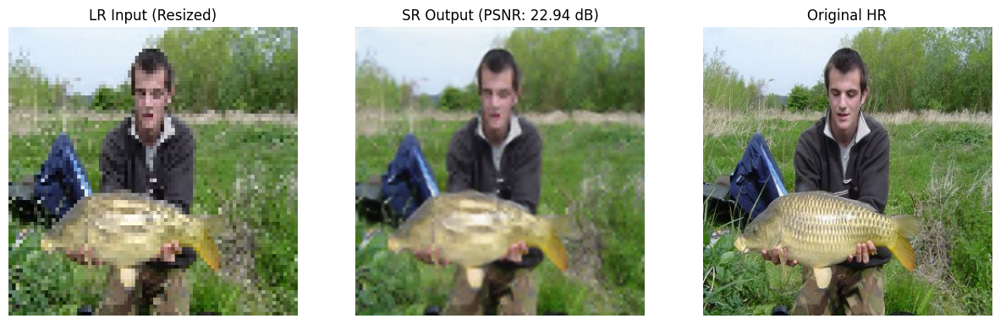

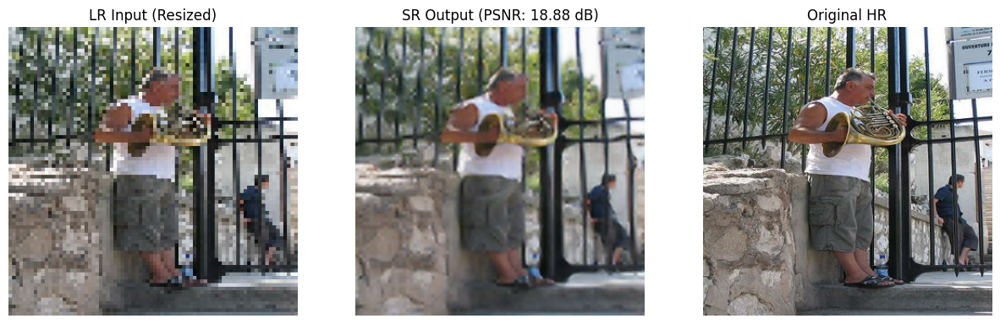

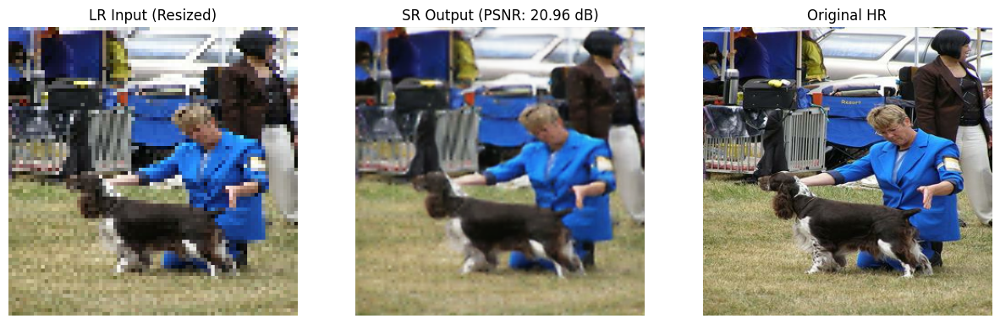

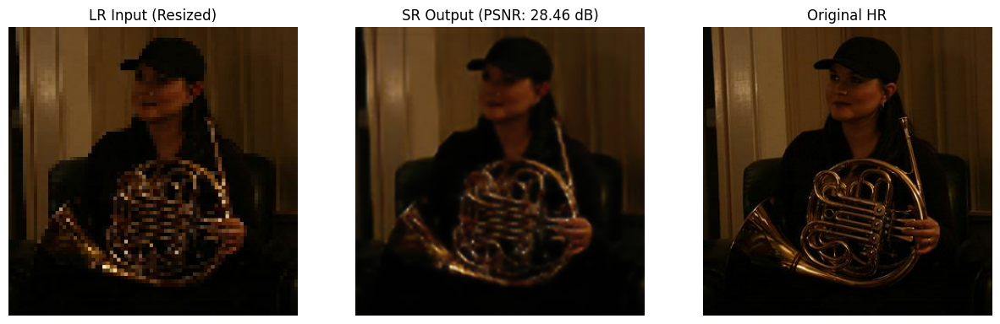

In [ ]:
# Elegir algunas imágenes de test aleatorias para visualización:  SRCNN1_MODEL (UpSampling2D)
num_images_to_display = 4
random.seed(26)
random_indices = random.sample(range(len(test_sr_ds)), num_images_to_display)

# Para cada imagen
for index in random_indices:
    # Leer y procesar una imagen de test
    lr, hr = next(iter(test_sr_ds.skip(index).take(1).batch(1))) # obtener la imagen ubicada en index
    lr = tf.squeeze(lr).numpy()
    hr = tf.squeeze(hr).numpy()

    # Generar superresolución
    sr = srcnn1_model.predict(tf.expand_dims(lr, axis=0),verbose=0) # añadir dimensión batch para predicción
    sr = tf.squeeze(sr).numpy()  # eliminar la dimensión batch
    sr = np.clip(sr, 0.0, 1.0)  # escalar pixel a intervalo [0, 1]

    # Calcular PSNR
    psnr = tf.image.psnr(hr, sr, max_val=1.0).numpy()

    # Preparar imágenes para visualizar del mismo tamaño
    lr_resized = tf.image.resize(
        lr,
        size=(hr.shape[0], hr.shape[1]),
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    ).numpy()

    # Las imágenes están en [0,1], escalar a [0,255] para mostrar correctamente
    lr_resized = (lr_resized * 255).astype(np.uint8)
    sr = (sr * 255).astype(np.uint8)
    hr = (hr * 255).astype(np.uint8)

    # Mostrar las imágenes
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(lr_resized)
    axes[0].set_title("LR Input (Resized)")
    axes[0].axis("off")

    axes[1].imshow(sr)
    axes[1].set_title("SR Output (PSNR: {:.2f} dB)".format(psnr))
    axes[1].axis("off")

    axes[2].imshow(hr)
    axes[2].set_title("Original HR")
    axes[2].axis("off")

    plt.show()

In [ ]:
# Lista para almacenar la PSNR de cada imagen: SRCNN2_MODEL (Conv2DTranspose)
psnr_values = []

# Recorrer el dataset de test (batch size = 1)
for lr, hr in test_sr_ds:
    # Add a batch dimension to lr for prediction
    lr = tf.expand_dims(lr, axis=0)

    # Generar la imagen de superresolución a partir de la imagen LR
    sr = srcnn2_model.predict(lr, verbose=0)

    # Remove the batch dimension from sr and ensure values are in [0, 1]
    sr = tf.squeeze(sr).numpy()
    sr = np.clip(sr, 0.0, 1.0)

    # Calcular la PSNR entre la imagen SR generada y la imagen HR original
    psnr = tf.image.psnr(hr, sr, max_val=1.0).numpy()
    psnr_values.append(psnr)

# Calcular la PSNR media del conjunto de test
avg_psnr = np.mean(psnr_values)
print(f"PSNR media en el conjunto de test: {avg_psnr:.2f} dB")

PSNR media en el conjunto de test: 24.10 dB


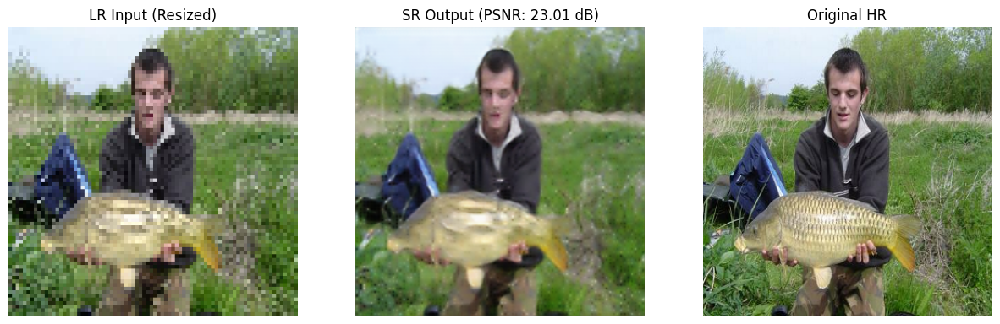

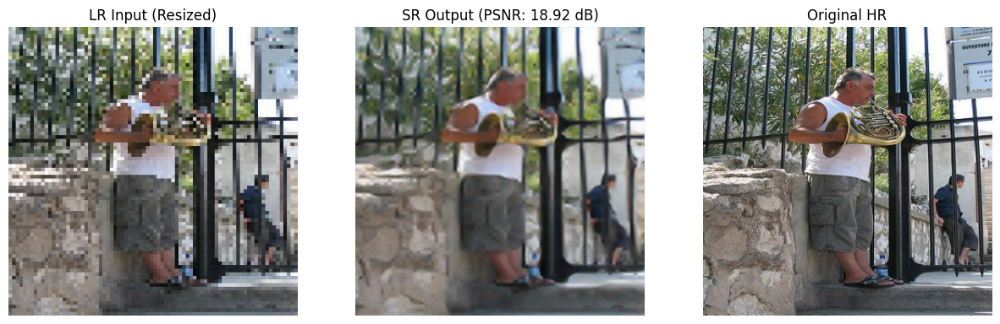

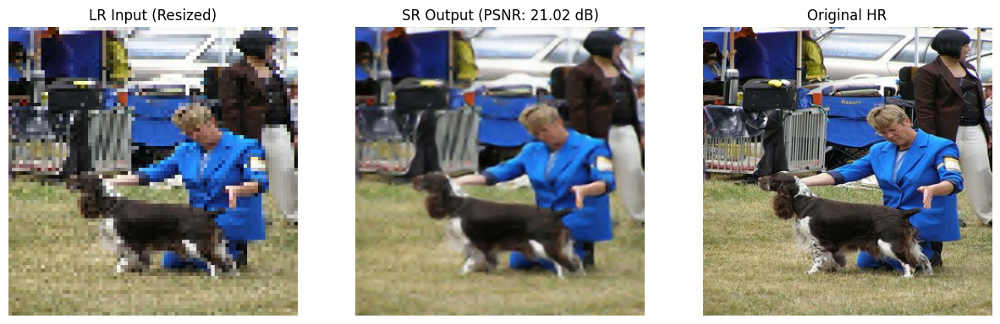

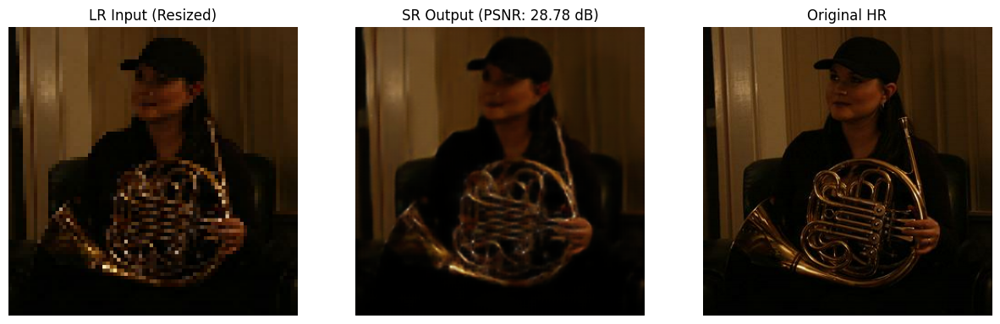

In [ ]:
# Elegir algunas imágenes de test aleatorias para visualización:  SRCNN2_MODEL (Conv2DTranspose)
num_images_to_display = 4
random.seed(26)
random_indices = random.sample(range(len(test_sr_ds)), num_images_to_display)

# Para cada imagen
for index in random_indices:
    # Leer y procesar una imagen de test
    lr, hr = next(iter(test_sr_ds.skip(index).take(1).batch(1))) # obtener la imagen ubicada en index
    lr = tf.squeeze(lr).numpy()
    hr = tf.squeeze(hr).numpy()

    # Generar superresolución
    sr = srcnn2_model.predict(tf.expand_dims(lr, axis=0),verbose=0) # añadir dimensión batch para predicción
    sr = tf.squeeze(sr).numpy()  # eliminar la dimensión batch
    sr = np.clip(sr, 0.0, 1.0)  # escalar pixel a intervalo [0, 1]

    # Calcular PSNR
    psnr = tf.image.psnr(hr, sr, max_val=1.0).numpy()

    # Preparar imágenes para visualizar del mismo tamaño
    lr_resized = tf.image.resize(
        lr,
        size=(hr.shape[0], hr.shape[1]),
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    ).numpy()

    # Las imágenes están en [0,1], escalar a [0,255] para mostrar correctamente
    lr_resized = (lr_resized * 255).astype(np.uint8)
    sr = (sr * 255).astype(np.uint8)
    hr = (hr * 255).astype(np.uint8)

    # Mostrar las imágenes
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(lr_resized)
    axes[0].set_title("LR Input (Resized)")
    axes[0].axis("off")

    axes[1].imshow(sr)
    axes[1].set_title("SR Output (PSNR: {:.2f} dB)".format(psnr))
    axes[1].axis("off")

    axes[2].imshow(hr)
    axes[2].set_title("Original HR")
    axes[2].axis("off")

    plt.show()

Comenta los resultados obtenidos:
<ul>
    <li>¿Qué valores de PSNR se obtienen? (comentar tanto el de los ejemplos mostrados como el valor medio sobre el total del conjunto de test)</li>
    <li>¿Se ven nítidas las imágenes superresueltas?</li>
    <li>¿Qué tipos de detalles o errores se observan?</li>
</ul>

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<ul>
Los dos modelos muestran un desempeño casi idéntico tanto en métrica PSNR (algo más de 24 dB) como en la isnpección visual de la muestra de imágenes consideradas que resultan indistinguibles.
 </ul>
<br><br>
   Análisis de resultados del modelo SR:
   <ul>
       <li><strong>PSNR</strong>:</li>
          <ul>
              <li>SRCNN1: Promedio 24.10, Imágenes: [22.94,18.88,20.96,28.46]  </li>
              <li>SRCNN2=24.23, Imágenes: [23.01,18.92,21.02,28.78]</li>
          </ul>
       <li><strong>Calidad visual</strong>:</li>
          <ul>
              <li>Las imágenes super resueltas(sr) resultan más nitidas que las de entrada(lr) y no muestran su apariencia pixelada.</li>
              <li>Pero resultan mucho menos nítidas que las de salida(hr)</li
              <li></li>
          </ul>
       <li><strong>Errores</strong>:
       <ul>
       <li>Esencialmente resultan muy borrosas comparadas a las de salida</li>
       <li>En especial, destaca la pérdida de detalles como las gafas en la tercera imágen o del instrumento de viento en las imágenes segunda y cuarta.</li>
      </ul>
   </ul>
</div>

# Extra: Descripción de la métrica PSNR:
$$PSNR = 20 \cdot \log_{10}\left(\frac{MAX_I}{\sqrt{MSE}}\right)$$


$$MSE = \frac{1}{m \cdot n} \sum_{i=1}^{m} \sum_{j=1}^{n} \left[ (Etiqueta(i, j) - Reconstruida(i, j))^2 \right]$$

donde,

MAX_I = máximo valor de pixel de una imagen (en nuestro caso 255)

MSE = Error Cuadrático Medio entre las imagenes originales (etiquetas) y las reconstruida (output del modelo) para cada imagen de baja resolución del conjunto de test. Se calcula a partir de las diferencias entre los correspondientes pixeles de cada imagen)

## 7. Modelo pre-entrenado en superresolución (1 punto)

Los avances recientes en superresolución han producido arquitecturas más complejas (p. ej., basadas en Redes Generativas Adversarias) que logran resultados notablemente mejores, a costa de un entrenamiento costoso. Uno de estos modelos es ESRGAN ([Enhanced Super-Resolution GAN por Xintao Wang et al.](https://arxiv.org/abs/1809.00219), entrenado en grandes bases de datos de imágenes HD (como DIV2K) para lograr superresolución 4× con gran fidelidad. Afortunadamente, podemos aprovechar un modelo pre-entrenado en lugar de entrenar uno desde cero.

Vamos a emplear un modelo pre-entrenado de ESRGAN disponible vía [TensorFlow Hub](https://www.tensorflow.org/hub/tutorials/image_enhancing)

Este modelo ha sido entrenado en el conjunto DIV2K (imágenes de alta calidad) con degradación bicúbica, por lo que está especializado en producir imágenes 4× más grandes con notable detalle.

Usaremos ESRGAN para aplicar superresolución a las mismas imágenes de test y compararemos los resultados con nuestro modelo implementado en el ejercicio 5.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 7 [1 pt]:</strong> Utiliza un modelo pre-entrenado de superresolución (p. ej. ESRGAN 4×) para mejorar las imágenes de baja resolución. En concreto:
    <ul>
        <li>Carga el modelo pre-entrenado desde TensorFlow Hub (usa la URL proporcionada, por ejemplo <code>"https://tfhub.dev/captain-pool/esrgan-tf2/1"</code>).</li>
        <li>Para una selección de imágenes de test de baja resolución (80×80), obtén la superresolución 4× con este modelo.</li>
        <li>Calcula la PSNR de las imágenes generadas por el modelo pre-entrenado (en el total del conjunto de test) y compara su media con la PSNR media obtenida por tu modelo.</li>
        <li>Visualiza las imágenes de salida del modelo pre-entrenado junto a las de tu modelo y las originales, para comparar visualmente la calidad. Compara también la PSNR de esas imágenes.</li>
    </ul>
Discute las diferencias observadas:
    <ul>
        <li>¿El modelo pre-entrenado obtiene mejores métricas?</li>
        <li>¿El modelo pre-entrenado produce imágenes más nítidas y cercanas a la realidad?</li>
        <li>¿En qué detalles se nota la mejoría?</li>
    </ul>    
</div>

In [ ]:
#!pip install tensorflow_hub
import tensorflow_hub as hub

# Cargamos el modelo ESRGAN desde TF-Hub:
esrgan = hub.load("https://tfhub.dev/captain-pool/esrgan-tf2/1")
print("Modelo ESRGAN cargado.")

Modelo ESRGAN cargado.


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np

# Lista para almacenar la PSNR de cada imagen usando ESRGAN
psnr_values_esrgan = []


# Recorrer el dataset de test (no batched)
for lr, hr in test_sr_ds:
    # Preparar la imagen LR para ESRGAN:
    # ESRGAN espera entrada en rango [0,255] como float32, y test_sr_ds tiene imágenes en [0,1]
    lr_for_esrgan = tf.cast(lr * 255, tf.float32)
    lr_for_esrgan = tf.expand_dims(lr_for_esrgan, axis=0)  # Add batch dimension

    # Generar la imagen de superresolución con ESRGAN
    sr_esrgan = esrgan(lr_for_esrgan)

    # Quitar la dimensión de batch y normalizar la salida a [0,1]
    sr_esrgan = tf.squeeze(sr_esrgan).numpy() / 255.0

    # Obtener la imagen HR correspondiente
    # No es necesario quitar la dimensión de batch, as it is already individual images

    # Calcular la PSNR entre la imagen generada por ESRGAN y la imagen HR original
    psnr_esrgan = tf.image.psnr(hr, sr_esrgan, max_val=1.0).numpy()
    psnr_values_esrgan.append(psnr_esrgan)

# Calcular la PSNR media en el conjunto de test con ESRGAN
avg_psnr_esrgan = np.mean(psnr_values_esrgan)
print(f"PSNR media en el conjunto de test con ESRGAN: {avg_psnr_esrgan:.2f} dB")


PSNR media en el conjunto de test con ESRGAN: 18.59 dB


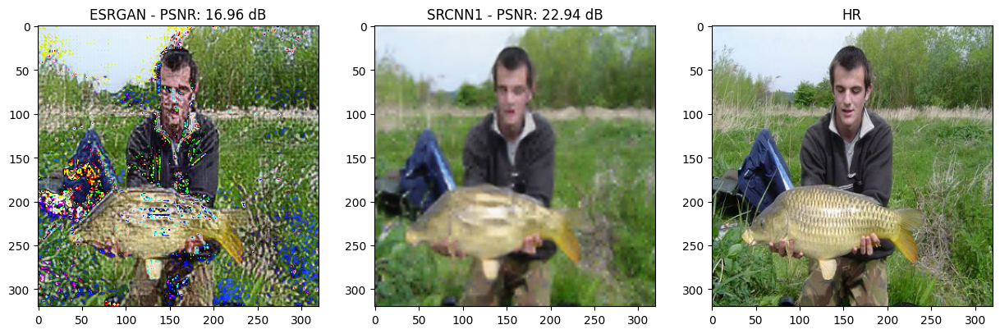

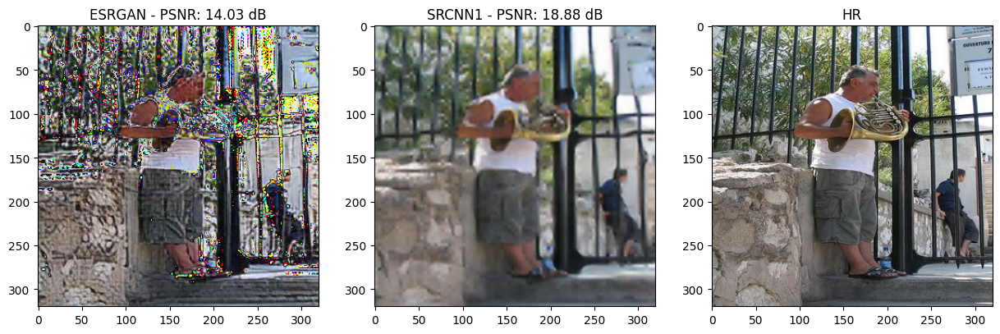

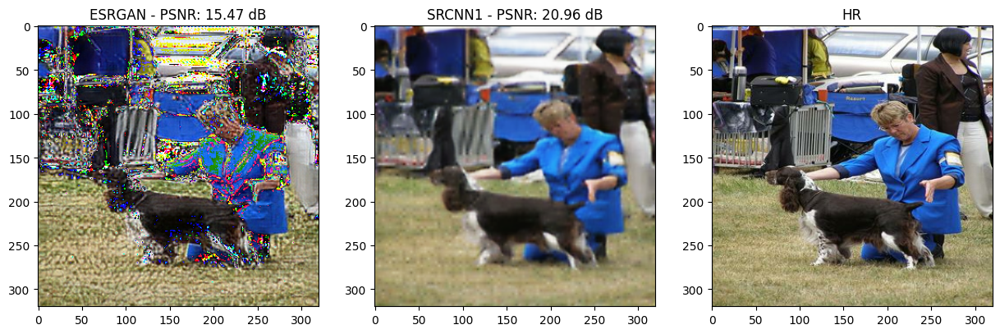

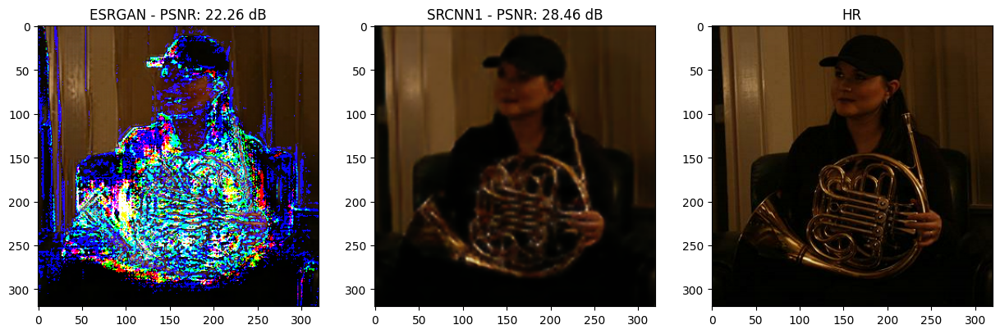

In [ ]:
# Elegir algunas imágenes de test aleatorias para visualización: ESRGAN Versus SRCNN1
num_images_to_display = 4  # Number of images to display
random.seed(26)
random_indices = random.sample(range(len(test_sr_ds)), num_images_to_display)

for index in random_indices:
    # Leer y procesar una imagen de test
    lr, hr = next(iter(test_sr_ds.skip(index).take(1)))

    # Generar superresolución con SRCNN1
    lr_for_srcnn1 = tf.expand_dims(lr, axis=0)
    sr_srcnn1 = srcnn1_model.predict(lr_for_srcnn1, verbose=0)
    sr_srcnn1 = tf.squeeze(sr_srcnn1).numpy()
    sr_srcnn1 = np.clip(sr_srcnn1, 0.0, 1.0)

    # Generar superresolución con ESRGAN
    lr_for_esrgan = tf.cast(lr * 255, tf.float32)
    lr_for_esrgan = tf.expand_dims(lr_for_esrgan, axis=0)
    sr_esrgan = esrgan(lr_for_esrgan)
    sr_esrgan = tf.squeeze(sr_esrgan).numpy() / 255.0

    # Calcular PSNR para SRCNN1
    psnr_srcnn1 = tf.image.psnr(hr, sr_srcnn1, max_val=1.0).numpy()

    # Calcular PSNR para ESRGAN
    psnr_esrgan = tf.image.psnr(hr, sr_esrgan, max_val=1.0).numpy()

    # Las imágenes están en [0,1], escalar a [0,255] para mostrar correctamente
    sr_srcnn1 = (sr_srcnn1 * 255).astype(np.uint8)
    sr_esrgan = (sr_esrgan * 255).astype(np.uint8)
    hr = (hr.numpy() * 255).astype(np.uint8)  # Convert hr to NumPy array before astype


    # Mostrar las imágenes
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(sr_esrgan)  # Mostrar la imagen generada por ESRGAN
    axes[0].set_title(f"ESRGAN - PSNR: {psnr_esrgan:.2f} dB")
    axes[1].imshow(sr_srcnn1)
    axes[1].set_title(f"SRCNN1 - PSNR: {psnr_srcnn1:.2f} dB")
    axes[2].imshow(hr)
    axes[2].set_title("HR")
    plt.show()

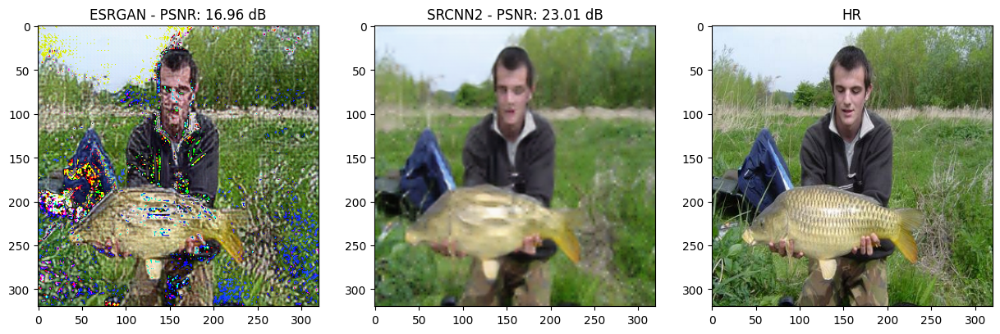

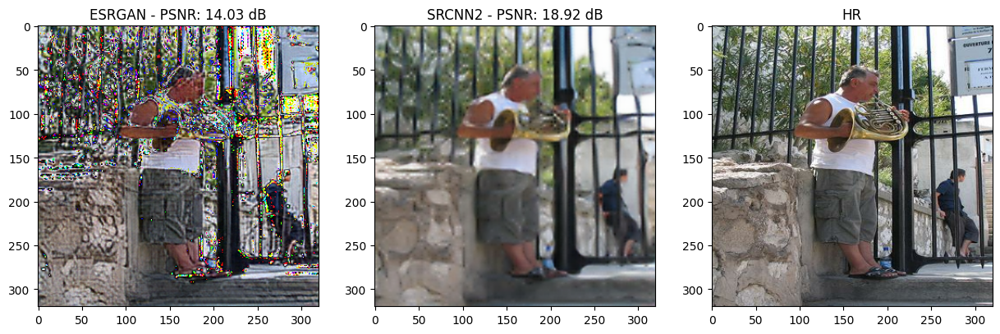

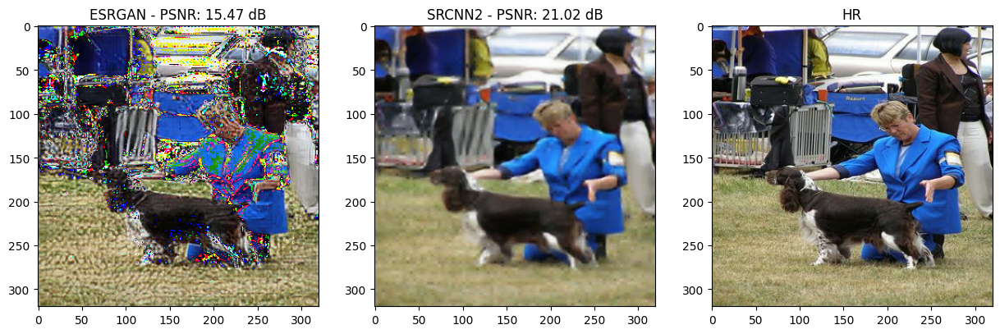

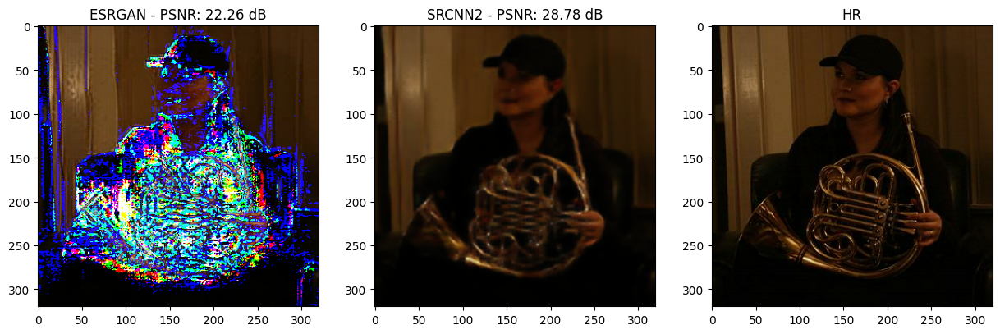

In [ ]:
# Elegir algunas imágenes de test aleatorias para visualización: ESRGAN Versus SRCNN2
num_images_to_display = 4  # Number of images to display
random.seed(26)
random_indices = random.sample(range(len(test_sr_ds)), num_images_to_display)

for index in random_indices:
    # Leer y procesar una imagen de test
    lr, hr = next(iter(test_sr_ds.skip(index).take(1)))

    # Generar superresolución con SRCNN1
    lr_for_srcnn2 = tf.expand_dims(lr, axis=0)
    sr_srcnn2 = srcnn2_model.predict(lr_for_srcnn2, verbose=0)
    sr_srcnn2 = tf.squeeze(sr_srcnn2).numpy()
    sr_srcnn2 = np.clip(sr_srcnn2, 0.0, 1.0)

    # Generar superresolución con ESRGAN
    lr_for_esrgan = tf.cast(lr * 255, tf.float32)
    lr_for_esrgan = tf.expand_dims(lr_for_esrgan, axis=0)
    sr_esrgan = esrgan(lr_for_esrgan)
    sr_esrgan = tf.squeeze(sr_esrgan).numpy() / 255.0

    # Calcular PSNR para SRCNN1
    psnr_srcnn2 = tf.image.psnr(hr, sr_srcnn2, max_val=1.0).numpy()

    # Calcular PSNR para ESRGAN
    psnr_esrgan = tf.image.psnr(hr, sr_esrgan, max_val=1.0).numpy()

    # Las imágenes están en [0,1], escalar a [0,255] para mostrar correctamente
    sr_srcnn2 = (sr_srcnn2 * 255).astype(np.uint8)
    sr_esrgan = (sr_esrgan * 255).astype(np.uint8)
    hr = (hr.numpy() * 255).astype(np.uint8)  # Convert hr to NumPy array before astype


    # Mostrar las imágenes
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(sr_esrgan)  # Mostrar la imagen generada por ESRGAN
    axes[0].set_title(f"ESRGAN - PSNR: {psnr_esrgan:.2f} dB")
    axes[1].imshow(sr_srcnn2)
    axes[1].set_title(f"SRCNN2 - PSNR: {psnr_srcnn2:.2f} dB")
    axes[2].imshow(hr)
    axes[2].set_title("HR")
    plt.show()

Discute las diferencias observadas:
    <ul>
        <li>¿El modelo pre-entrenado obtiene mejores métricas?</li>
        <li>¿El modelo pre-entrenado produce imágenes más nítidas y cercanas a la realidad?</li>
        <li>¿En qué detalles se nota la mejoría?</li>
    </ul>   

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<ul>
    <li><strong>Métricas (PSNR)</strong>:</li>
        <ul>
        <li>No, el modelo pre-entrenado tiene peor métrica: un PSNR inferior en casi 6 dB a SRCNN2.</li>
    </ul>   
    <li><strong>Calidad visual</strong>:</li>
        <ul>
        <li>No, el modelo pre-entrenado no más nitidas en general pero sí mucho más pixeladas y por ende más alejadas de la realidad.</li>
    </ul>   
    <li><strong>Detalles</strong>:</li>
        <ul>
        <li>Puede notarse mayor nitidez en algunas zonas, pero la mayor pixelación en casi toda la foto hace que en conjunto no pueda considerarse que aporte una mejora.</li>
    </ul>   
</ul>  
</div>

## 8. Comparativa y conclusiones (0.5 pts)

En esta práctica hemos explorado tanto la clasificación de imágenes con redes neuronales (densas vs convolucionales) como la superresolución con CNNs, aplicándolo todo sobre la base de datos Imagenette.


<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;"> <strong>Ejercicio 8[0.5 pts]:</strong> Realiza un resumen de los puntos aprendidos en esta PEC. En concreto, resume en una frase lo aprendido sobre cada uno de los puntos que se enumeran a continuación: <ul>
    <li><strong>ANN vs CNN:</strong></li>
    <li><strong>Regularización y aumentación:</strong></li>
    <li><strong>Superresolución:</strong></li>
    <li><strong>Transfer learning:</strong></li>
</ul></div>

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
Conclusiones finales:
<ul>
    <li><strong>ANN vs CNN:</strong></li>
    <ul>
        <li>Sorprende que <b>un simple Multi-Perceptron puede batir al azar en la clasificación de imágenes, pero una red convolucional puede hacer mucho más que eso</b>, alcanzando niveles mucho más elevados de precisión.</li>
    </ul>
    <li><strong>Regularización y aumentación:</strong></li>
        <ul>
        <li>Incluso en casos donde no aporte ganancias en desempeño predictivo, <b>la aumentación puede acelerar el proceso de aprendizaje al aportar un efecto de regularización</b> que mitiga el riesgo de sobreentrenamiento.</li>
    </ul>
    <li><strong>Superresolución:</strong></li>
        <ul>
        <li><b>Sorprende que capas de UpSampling2D puedan conseguir algunas veces el mismo resultado que capas entrenadas de Conv2DTransposed</b>, permitiendo ahorrar tiempo de entrenamiento sin perdida apreciable de desempeño predictivo.</li>
    </ul>
    <li><strong>Transfer learning:</strong></li>
        <ul>
        <li> <b>El "Transfer learning" no es una panacea</b>, en nuestro caso el problema no es tan complejo (sólo 10 categorías de imágenes) y se cuenta con suficientes datos como para poder lograr un buen desempeño predictivo con una red convolucional para superresolución relativamente sencilla, siendo capaces de batir a un modelo preentranado mucho más complejo como ESRGAN.
    </ul>
</ul>
<br><br>
</div>